In [5]:
import pandas as pd
import numpy as np
from bioreactor.plotting import *
from bioreactor.use_colors import *
from bioreactor.annotation import *
from bioreactor.utils import read_dataset, median_scale
from bioreactor.ssgsea import *
from bioreactor.gsea import *
from bioreactor.expression import  *
from bioreactor.pathway_scoring import *
from bioreactor.survival import * 
from bioreactor.graphs import *

from bioreactor.plotting import *
from bioreactor.use_colors import *
from bioreactor.utils import *
from bioreactor.gsea import *
from bioreactor.mutations import *
from bioreactor.ssgsea import *
from bioreactor.clustering import *
from bioreactor.oncoplot2 import *
from bioreactor.cna import *

from mldeconv.cells_plotting import *
from mldeconv.data_loading import *

from typing import Tuple, List, Optional
import warnings
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from scipy.stats import spearmanr
import scipy

from collections import defaultdict
from scipy.spatial.distance import pdist, squareform
import itertools as it

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
def clustered_heatmap(
    ds, title='', corr='spearman', method='average',
    yl=True, xl=True, cmap='coolwarm', 
    figsize=(15,15), annot=True, vmin=0.5, vmax=1,
    col_colors_h_ratio=1, row_colors_w_ratio=1, 
    **kwargs):
    """
    Plot correlation heatmap for rows after performing clustering on dataset "ds"
    :param ds: pd.DataFrame, numerical data only

    """

    similarity_matrix = ds.dropna().T.corr(method=corr)
    dissimilarity_matrix = 1 - similarity_matrix
    hclust_linkage = linkage(squareform(dissimilarity_matrix), method=method)

    g = sns.clustermap(similarity_matrix.round(3), method=method,
                       row_linkage=hclust_linkage, col_linkage=hclust_linkage,
                       annot=annot, vmin=vmin, vmax=vmax,
                       cmap=cmap, yticklabels=yl, xticklabels=xl,
                       figsize=figsize, **kwargs)

    g.fig.suptitle(title)

    return resize_clustermap_annotation(g, col_colors_h_ratio, row_colors_w_ratio)

In [8]:
def genes_expression_chart_(genes, num_to_show=30, axes=None, figsize=(12, 8), source=None,
                           path_to_cells='/uftp/Deconvolution/Data/Median_Cells_by_sample-kallisto-Xena-gene-TPM_without_noncoding',
                           path_to_lines='/uftp/Deconvolution/Data/Median_Cancer_cell_lines_by_sample-kallisto-Xena-gene-TPM_without_noncoding',
                           path_to_tissues='/uftp/Deconvolution/Data/Mean_Tissues_by_sample-kallisto-Xena-gene-TPM_without_noncoding.tsv'):
    """
    Function makes chart of genes expression from all sources
    :param genes: list of genes
    :param num_to_show: number of cells / lines with highest expression level to show (top-k)
    :param axes: axes to plot
    :param figsize: size of a figure
    :param source: 'lines', 'cells' or 'all'
    :param path_to_cells: path to cells expression data
    :param path_to_lines: path to lines expression data
    :param path_to_tissues: path to tissues expression data
    :returns: tables with genes expression
    """
    from bioreactor.plotting import lin_colors
    
    if not (source == 'lines' or source == 'cells' or source == 'tissues'or source == 'all' or source == None):
        raise ValueError("Incorrect source type! Only cells, lines, tissues or all are available.")
        
    cells = pd.read_csv(path_to_cells, sep=',', index_col=0)
    lines = pd.read_csv(path_to_lines, sep=',', index_col=0)
    tissues = pd.read_csv(path_to_tissues, sep='\t', index_col=0)
        
    for common_name in set(lines.columns).intersection(set(cells.columns)):
        lines.rename(columns={common_name: common_name + '_line'}, inplace=True)
        cells.rename(columns={common_name: common_name + '_sample'}, inplace=True)
    for common_name in set(cells.columns).intersection(set(tissues.columns)):
        cells.rename(columns={common_name: common_name + '_sample'}, inplace=True)
        tissues.rename(columns={common_name: common_name + '_tissue'}, inplace=True)
    for common_name in set(lines.columns).intersection(set(tissues.columns)):
        lines.rename(columns={common_name: common_name + '_line'}, inplace=True)
        tissues.rename(columns={common_name: common_name + '_tissue'}, inplace=True)
    
    for gene in genes:
        if gene not in cells.index:
            print("Gene {} is not found".format(gene))
            genes.remove(gene)

    if axes is not None:
        assert len(genes) == len(axes.flat), "Length of genes list should be equal to the number of subplots!"
    else:
        fig, axes = plt.subplots(len(genes), 1, figsize=(figsize[0], figsize[1] * len(genes)))
    
    for ax, gene in zip(axes.flat, genes):
        if source == 'lines':
            exp = lines.loc[gene].sort_values(ascending=False)[:num_to_show]
        elif source == 'cells':
            exp = cells.loc[gene].sort_values(ascending=False)[:num_to_show]
        elif source == 'tissues':
            exp = tissues.loc[gene].sort_values(ascending=False)[:num_to_show]
        else:
            exp = pd.concat([cells.loc[gene], lines.loc[gene]]).sort_values(ascending=False)[:num_to_show]
        palette = lin_colors(exp.index)
        ax.set_title(gene, size=20) 
        ax.set_xticklabels(exp.index, rotation='vertical', fontsize=12) 
        exp.plot(kind='bar', ax=ax, color=list(exp.index.map(palette)), grid=False)
    plt.tight_layout()
    plt.show()
    
    return axes, exp

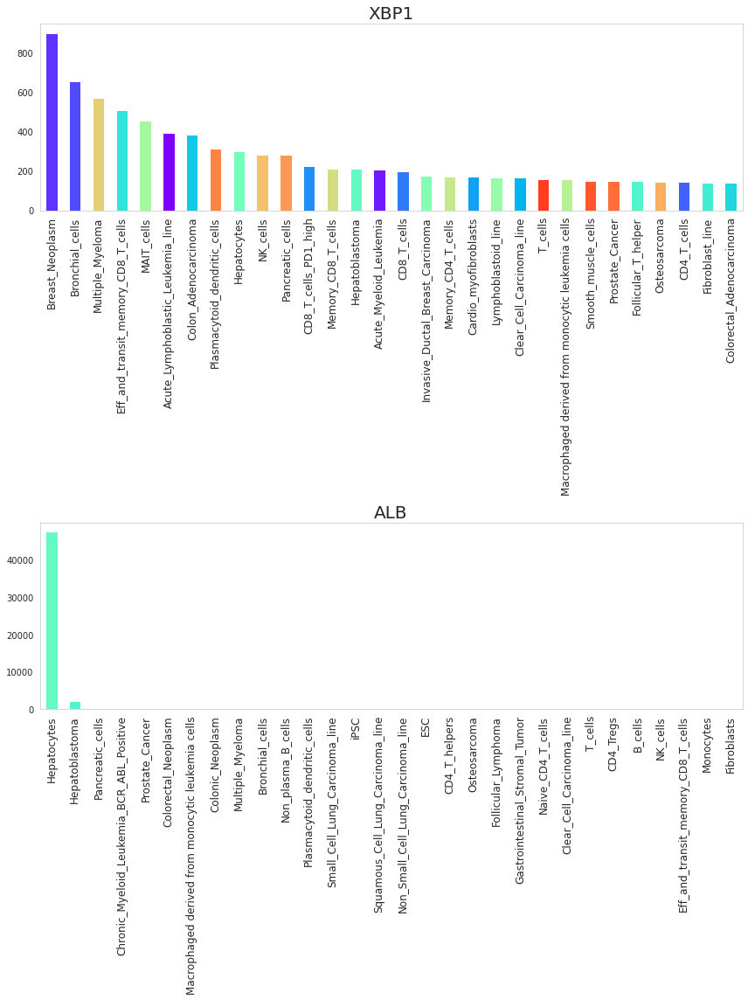

In [9]:
axs, exp = genes_expression_chart_(genes=['XBP1', 'ALB'], source='all')

In [10]:
def gene_corr_plot(genes, df, diag):
#     display(genes)
    clustered_heatmap(df.reindex(genes), title=diag, metric='spearman', vmin=0, vmax=1);
    df_ranks = pd.concat(list(get_ranks(df)), axis=1).T
    df_ranks = df_ranks.reindex(genes)
    order = df_ranks.sum().sort_values(ascending=False).index
    df_ranks = df_ranks.reindex(order, axis=1)
    _, ax = plt.subplots(figsize=(15,4))
    sns.heatmap(
        df_ranks.reindex(get_hclust_order(df_ranks, metric='spearman')), 
        cbar=False, cmap='coolwarm', xticklabels=False, ax=ax
    );
    df = df.reindex(genes)
    data = pd.melt(df.T)
    data['KDE'] = 'Gene'


    data2 = \
    pd.Series(
        data=list(it.chain.from_iterable(it.repeat(df.mean(), len(df.index)))),
        index=list(it.chain.from_iterable(it.repeat(x, len(df.columns)) for x in df.index)),
        name='value'
    )

    data2 = data2.reset_index().rename(columns={'index': 'Gene'})

    data2['KDE'] = 'Mean'

    _, ax = plt.subplots(figsize=(len(df.index)*1.5,5))

    ax2 = sns.violinplot(
        x='Gene',
        y='value',
        hue='KDE',
        data=pd.concat([data, data2]),
        palette="Set2",
        split=True,
        scale="count",
        inner='box',
        ax=ax
    )
    ax2.set_xticklabels(ax.get_xticklabels(), rotation=45);
    plt.show()

In [11]:
def get_gspread(table, sheet, index_col=0, path_to_json=None): 
    """
    Access Google Sheets via python
    
    :param path_to_json: absolute path to JSON containing creditials for Google API
    :param table: Annotation calculated, for instance
    :param sheet: Blood, for instance
    :param index_col: column number
    :return: pandas DataFrame
    """
    from oauth2client.service_account import ServiceAccountCredentials
    import gspread
    
    if path_to_json == None:
        path_to_json = '/uftp/Blood/google_secret.json'

    credentials = ServiceAccountCredentials.from_json_keyfile_name(
        path_to_json)  # Your json file here
    gc = gspread.authorize(credentials)

    # open table
    wks = gc.open(table)
    # select sheet
    sheet = wks.worksheet(sheet)
    data = pd.DataFrame(sheet.get_all_records())
    data = data.set_index(data.columns[index_col])
    return data

In [12]:
def get_hclust_order(
        data,
        metric='correlation',
        method='average',
        optimal_ordering=True,
        **kwargs
):
    """
    Return an order of observations that corresponds to the order of leaf nodes in a dendrogram of hierarchical clustering
    performed by clustering_method algorithm based on pairwise distance_metric

    REQUIRED
    :param data: pd.DataFrame, index - observations, columns - features.
                 Alternatively, ndarray, an m by n array of m original observations in an n-dimensional space

    OPTIONAL
    :param distance_metric: str, distance metric to use. See scipy.spatial.distance.pdist documentation for options
    :param clustering_method: str, linkage algorithm to use. See scipy.cluster.hierarchy.linkage documentation for options
    :param optimal_ordering: bool, if True, the linkage matrix will be reordered so that the distance between successive leaves is minimal.
                             See scipy.cluster.hierarchy.linkage for the full description.

    :return: list, a list of labels corresponding to the leaf nodes
    """

        
    if metric in ['spearman', 'kendall', 'pearson']:
        similarity_matrix = data.dropna().T.corr(method=metric)
        dissimilarity_matrix = 1 - similarity_matrix
        hclust_linkage = linkage(squareform(dissimilarity_matrix), method=method, optimal_ordering=True)
              
        
    else:
        dissimilarity_matrix = pdist(data.dropna(), metric=metric)
        hclust_linkage = linkage(dissimilarity_matrix, method=method, optimal_ordering=True)

    R = dendrogram(
        Z=hclust_linkage,
        labels=data.index,
        no_plot=True,
        **kwargs
    )

    leaf_order = R['ivl']

    return leaf_order

In [13]:
def get_expression_table(cohort, log=True):
    
    if log:
        return np.log2(read_dataset(f'/uftp/mvp-data/cohorts/{cohort}/expressions.tsv')+1).T
    else:
        return read_dataset(f'/uftp/mvp-data/cohorts/{cohort}/expressions.tsv').T

In [14]:
def get_anno(cohort):
    return read_dataset(f'/uftp/mvp-data/cohorts/{cohort}/annotation.tsv').T

In [15]:
def get_deconv(cohort):
    return read_dataset(f'/uftp/mvp-data/cohorts/{cohort}/deconvolution/cells_deconvolution_rna_percent.tsv').T

In [16]:
def get_ranks(df):  
    for gene in df.index:
        yield df.loc[gene].rank()

# Signature validation: Sorted cells and cell lines, public

## read anno

In [17]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [18]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/cells_clean_annotation.tsv')

In [19]:
cells_clean = cells_clean[(~cells_clean.index.str.contains('RNA'))&(~cells_clean.index.str.contains('WES'))&(~cells_clean.index.str.contains('210514_NovaA'))]

NB: Клеточный тип из описания датасета обозначен в колонке Cell_type, однако бывает, 
    что более подробное описание образца содержится в колонке Cell_type_details. 
    Также есть колонка Deconvolution_cell_type, 
    в которой значению в колонке Cell_type по возможности сопоставляется такой клеточный тип, 
    для которого сейчас существует модель (https://bostongene.atlassian.net/wiki/spaces/TD/pages/3626696724/bulk+RNA-seq)

In [20]:
cells_clean = cells_clean[['Cell_type', 'Dataset', 'Sample']]

In [21]:
public_cells_annot = cells_clean.copy()
public_cells_annot = public_cells_annot.reset_index(drop=True)

In [22]:
# split celltypes in case there are multiple celltypes per sample

celltypes_split = pd.DataFrame()

for i, j in public_cells_annot.dropna(subset=['Cell_type']).iterrows():
    if ';' in j['Cell_type']:
        ct = j['Cell_type'].split(';')
        new_row = j.copy()
        for c in ct:
            new_row['Cell_type'] = c
            celltypes_split = celltypes_split.append(new_row, ignore_index=True)
        public_cells_annot.drop(i, inplace=True)
        
public_cells_annot = public_cells_annot.append(celltypes_split)

In [23]:
public_cells_annot.index = public_cells_annot.Sample

## anno stats

In [24]:
pd.options.display.max_rows = len(public_cells_annot['Cell_type'].value_counts())
public_cells_annot['Cell_type'].value_counts()

CD4_T_cells                           1266
Macrophages                            527
CD8_T_cells                            453
Monocytes                              435
Fibroblasts                            418
Endothelium                            322
NK_cells                               202
Neutrophils                            199
Cardio_myofibroblasts                  197
Macrophages_M1                         189
Monocytic_DC                           169
T_cells                                148
Memory_CD4_T_cells                     129
Non_plasma_B_cells                     128
Tregs                                  120
Hepatocytes                            113
B_cells                                109
Dendritic_cells                         86
CD4_T_helpers                           73
PDC                                     58
Myeloid_cells                           54
CD8_T_cells_PD1_high                    48
Follicular_T_helper                     48
Central_mem

In [25]:
pd.options.display.max_rows = 10

In [26]:
public_cells_annot.head()

,Cell_type,Dataset,Sample
Sample,,,
SRX2378883,CD4_T_cells,GSE90569,SRX2378883
SRX2200829,T_cells,GSE87505,SRX2200829
SRX3263523,Monocytes,GSE104744,SRX3263523
SRX4525762,Hepatic_progenitor_cells,GSE118373,SRX4525762
SRX4797320,B_cells,GSE112101,SRX4797320


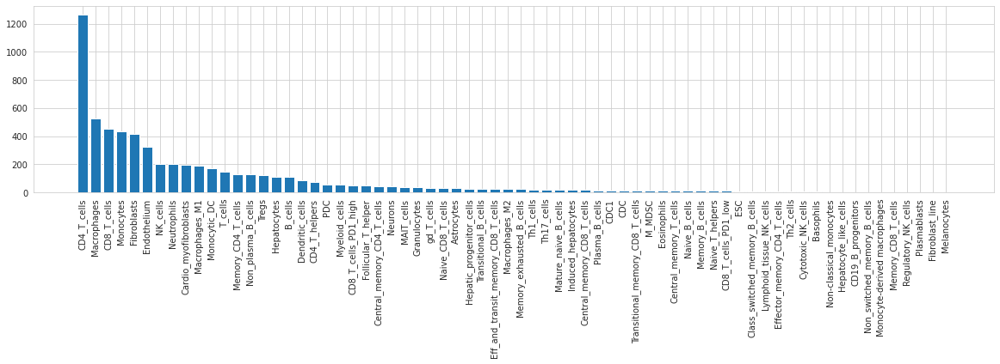

In [27]:
# a little bit of statistics
#example: which cell types do we have in lab_cells_annot?
plt.figure(figsize=(20, 4))
x = public_cells_annot['Cell_type'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

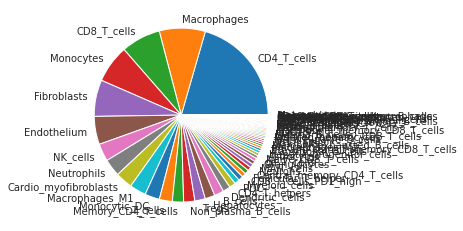

In [28]:
plt.pie(x, labels=x.index)
plt.show()

## read expressions

In [29]:
public_cells_expr = read_expressions(public_cells_annot)

In [30]:
public_cells_expr = np.log2(public_cells_expr+1)

## define custom signature

In [31]:
#signature_of_interest = '''IGKC	IGHM	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22',
'FCRL1',
'KLHL14',
'TNFRSF13B']

#add here a custon signature name
signature_name = 'B cell activation'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

## Validation itself

In [32]:
#define celltypes of interest
categories = ['Naive_B_cells', 
              'Secreting_B_cells', 
              'Class_switched_memory_B_cells', 
              'Non_switched_memory_B_cells', 
              'B_cells', 
              'CD27neg_Memory_B_cells', 
              'Memory_B_cells', 
              'NK_cells', 
              'Monocytes',
              'Neutrophils',
              'Basophils',
              'CD8_T_cells',
              'CD4_T_cells',
              'Fibroblasts',
              'Endothelium',
              'Tumor']

#dataframe subsetting
annot = pd.DataFrame()
for i in categories:
    annot = pd.concat([annot, public_cells_annot.loc[public_cells_annot['Cell_type'].isin([i])]])

#for sorting in the required order, could be skipped if the sorting is not needed
annot.Cell_type = pd.Categorical(annot['Cell_type'],
                                    categories=categories,
                                    ordered=True)
annot = annot.sort_values('Cell_type')

In [33]:
subsampling_public = [i[1].sample(np.min([5, i[1].shape[0]])).index.tolist() for i in annot.groupby('Cell_type')]

In [34]:
subsampling_public = [item for sublist in subsampling_public for item in sublist]

<AxesSubplot:xlabel='Cell_type'>

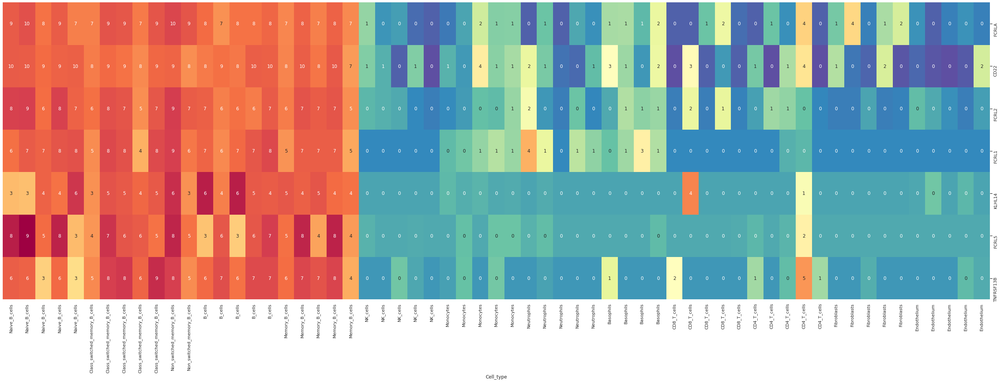

In [35]:
# A simple heatmap with log2 TPM of subsampled cells from celltypes of interest
genes_heatmap(
    public_cells_expr[subsampling_public],
    annot.reindex(subsampling_public)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

<AxesSubplot:xlabel='Cell_type'>

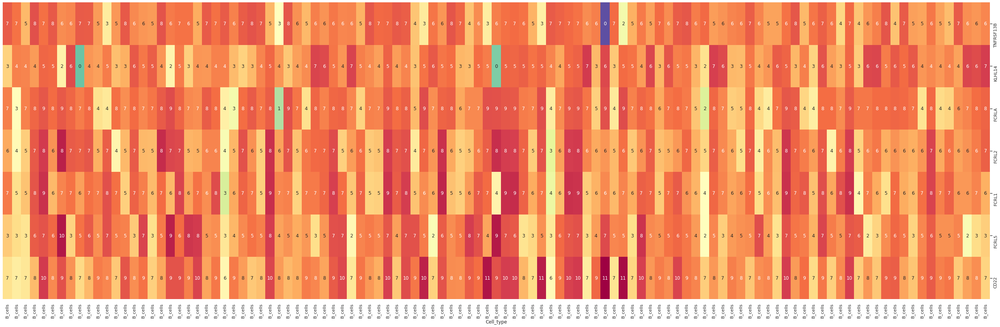

In [36]:
# A simple heatmap with log2 TPM of all cells of current celltype
c = ['B_cells']
subsampling_public = annot[annot['Cell_type'].isin(c)].index

genes_heatmap(
    public_cells_expr[subsampling_public],
    annot.reindex(subsampling_public)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

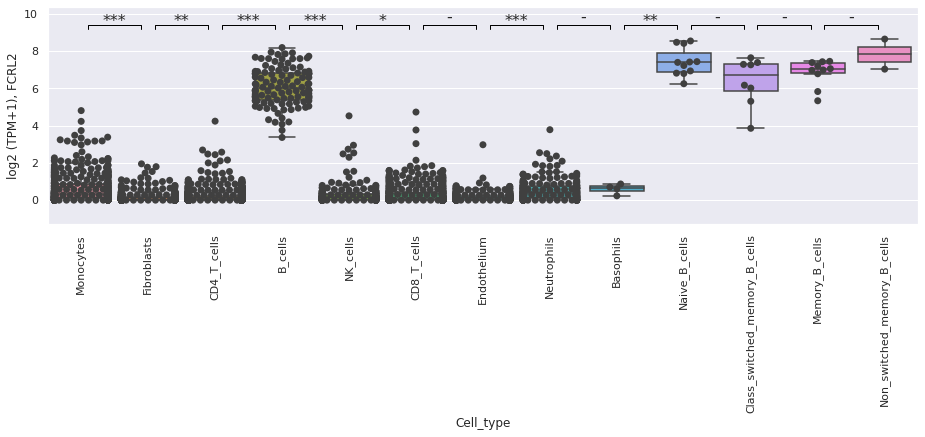

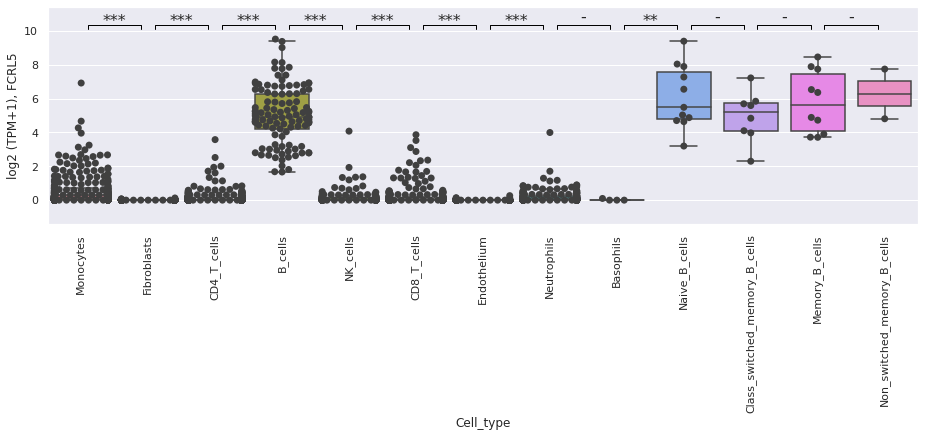

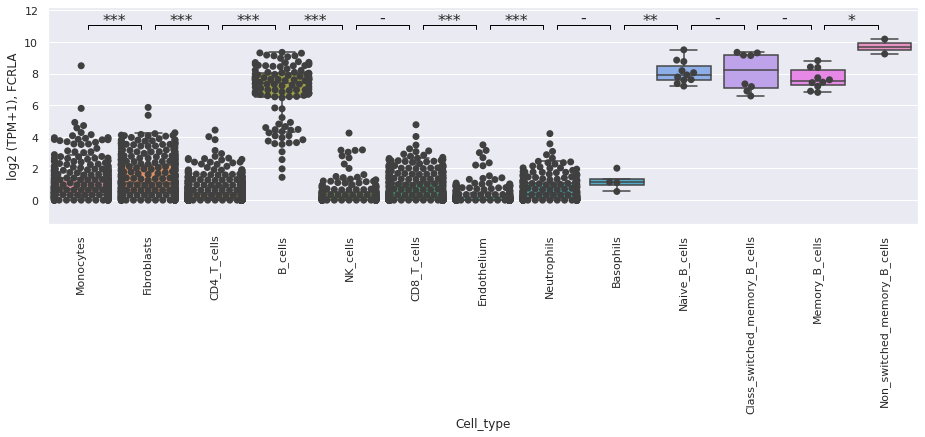

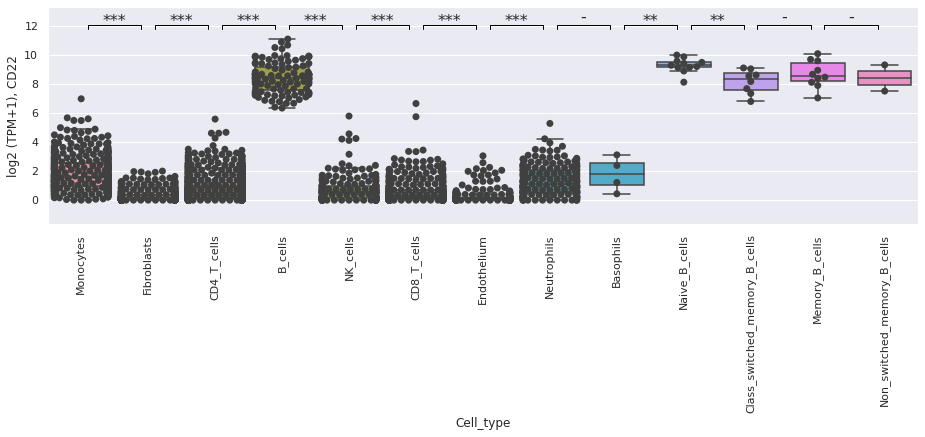

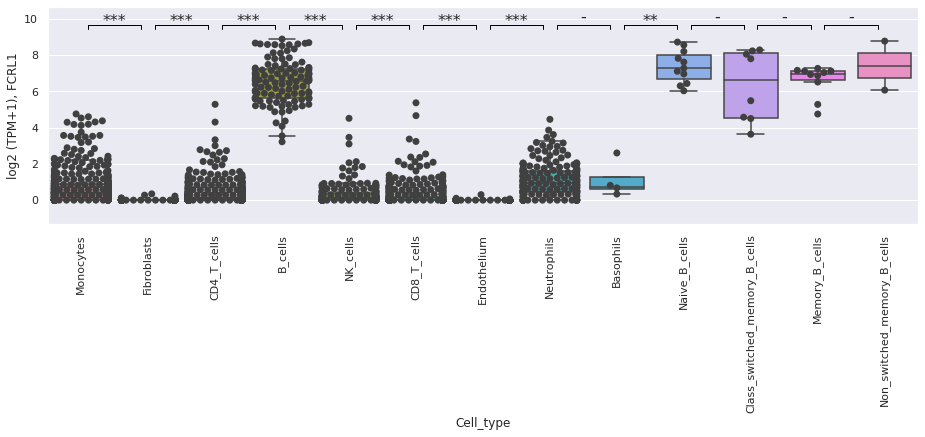

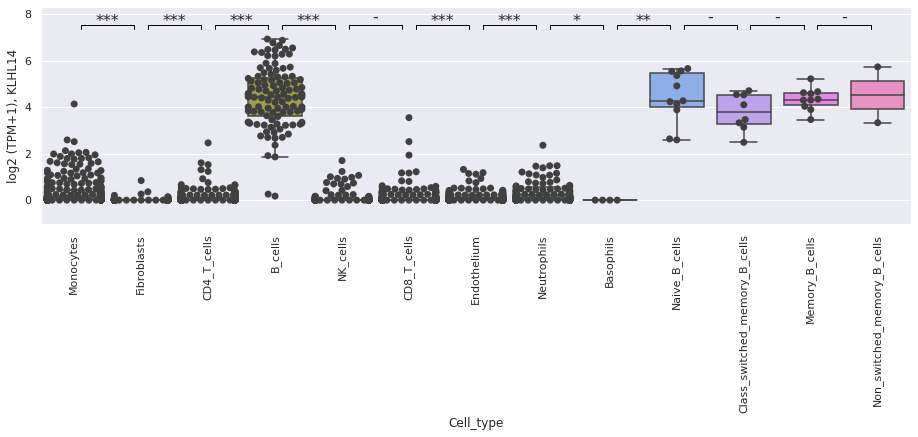

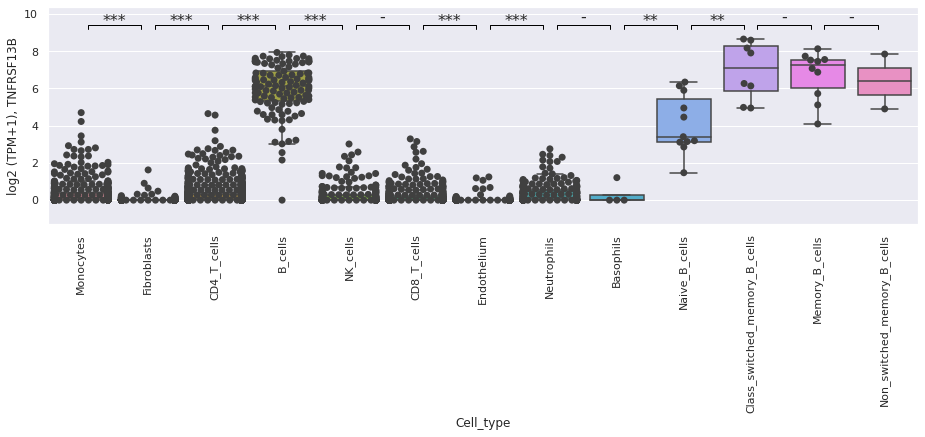

In [37]:
# boxplots depicting signature genes expression in celltypes of interest

categories = ['Naive_B_cells', 
              'Secreting_B_cells', 
              'Class_switched_memory_B_cells', 
              'Non_switched_memory_B_cells', 
              'B_cells', 
              'CD27neg_Memory_B_cells', 
              'Memory_B_cells', 
              'NK_cells', 
              'Monocytes',
              'Neutrophils',
              'Basophils',
              'CD8_T_cells',
              'CD4_T_cells',
              'Fibroblasts',
              'Endothelium',
              'Tumor'            
]

for gene in signature_of_interest:
    boxplot_with_pvalue(public_cells_expr.loc[gene], annot[annot['Cell_type'].isin(categories)]['Cell_type'])
    plt.ylabel(f'log2 (TPM+1), {gene}')
    plt.xticks(rotation=90)
    plt.show()

In [38]:
public_cells_ssgsea_unscaled = ssgsea_formula(public_cells_expr, gmt_genes_alt_names(geneset_of_interest, public_cells_expr.index, verbose=False)).T

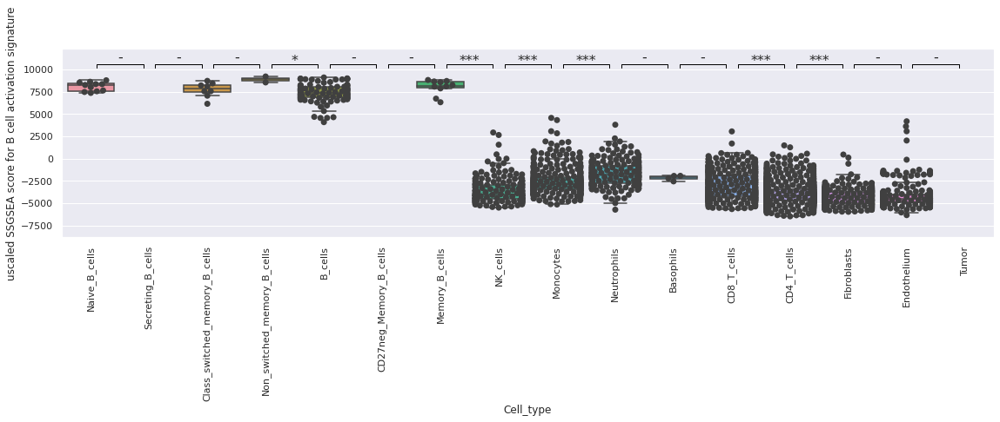

In [39]:
# boxplot depicting signature SSGSEA score in celltypes of interest

categories = ['Naive_B_cells', 
              'Secreting_B_cells', 
              'Class_switched_memory_B_cells', 
              'Non_switched_memory_B_cells', 
              'B_cells', 
              'CD27neg_Memory_B_cells', 
              'Memory_B_cells', 
              'NK_cells', 
              'Monocytes',
              'Neutrophils',
              'Basophils',
              'CD8_T_cells',
              'CD4_T_cells',
              'Fibroblasts',
              'Endothelium',
              'Tumor'             
]

boxplot_with_pvalue(public_cells_ssgsea_unscaled[signature_name], annot[annot['Cell_type'].isin(categories)]['Cell_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'uscaled SSGSEA score for {signature_name} signature')
plt.show()

# Signature validation: Sorted cells and cell lines from BG lab

## read anno

In [40]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [41]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/lab_clean_annotation.tsv')

NB: Клеточный тип из описания датасета обозначен в колонке Cell_type, однако бывает, 
    что более подробное описание образца содержится в колонке Cell_type_details. 
    Также есть колонка Deconvolution_cell_type, 
    в которой значению в колонке Cell_type по возможности сопоставляется такой клеточный тип, 
    для которого сейчас существует модель (https://bostongene.atlassian.net/wiki/spaces/TD/pages/3626696724/bulk+RNA-seq)

In [42]:
cells_clean = cells_clean[['Cell_type', 'Dataset', 'Sample']]

In [43]:
lab_cells_annot = cells_clean.copy()
lab_cells_annot = lab_cells_annot.reset_index(drop=True)

In [44]:
# split celltypes in case there are multiple celltypes per sample

celltypes_split = pd.DataFrame()

for i, j in lab_cells_annot.dropna(subset=['Cell_type']).iterrows():
    if ';' in j['Cell_type']:
        ct = j['Cell_type'].split(';')
        new_row = j.copy()
        for c in ct:
            new_row['Cell_type'] = c
            celltypes_split = celltypes_split.append(new_row, ignore_index=True)
        lab_cells_annot.drop(i, inplace=True)
        
lab_cells_annot = lab_cells_annot.append(celltypes_split)

In [45]:
lab_cells_annot.index = lab_cells_annot.Sample

In [46]:
set(lab_cells_annot.index).intersection(public_cells_annot.index)

set()

## anno stats

In [47]:
pd.options.display.max_rows = len(lab_cells_annot['Cell_type'].value_counts())
lab_cells_annot['Cell_type'].value_counts()

Central_memory_T_helpers                       26
Effector_memory_T_helpers                      21
CD4_T_cells                                    20
Tfh_cells                                      17
Monocytes                                      17
Total_live                                     17
Tumor                                          14
B_cells                                        13
Th1_CTL                                        12
CD206pos_Macrophages                           12
Th1_resting_cells                              10
Tregs                                           9
Th1_cells                                       9
Naive_CD8_T_cells                               9
CD8_T_cells                                     9
Th17_resting_cells                              9
Total_tumor_nonimmune                           9
Th2_resting_cells                               8
CX3CR1+_PD1+_CD45RA-_Memory_CD8_T_cells         8
NK_cells                                        8


In [48]:
pd.options.display.max_rows = 10

In [49]:
lab_cells_annot.head()

,Cell_type,Dataset,Sample
Sample,,,
210514_NovaA_Sample_152,Transitional_memory_CD8_T_cells,210514_NovaA_Sample_152_dataset,210514_NovaA_Sample_152
210514_NovaA_Sample_51,Plasma_B_cells,210514_NovaA_Sample_51_dataset,210514_NovaA_Sample_51
RNASeq-tumor-211203_NovaB_Sample_7,Total_live,RNASeq-tumor-211203_NovaB_Sample_7_dataset,RNASeq-tumor-211203_NovaB_Sample_7
RNASeq-tumor-210616_NovaA_Sample_59,Th17_Th1,RNASeq-tumor-210616_NovaA_Sample_59_dataset,RNASeq-tumor-210616_NovaA_Sample_59
RNASeq-tumor-211206_NovaB_Sample_18,CX3CR1+_CD69-_PD1-_CD39-_CD8_T_cells,RNASeq-tumor-211206_NovaB_Sample_18_dataset,RNASeq-tumor-211206_NovaB_Sample_18


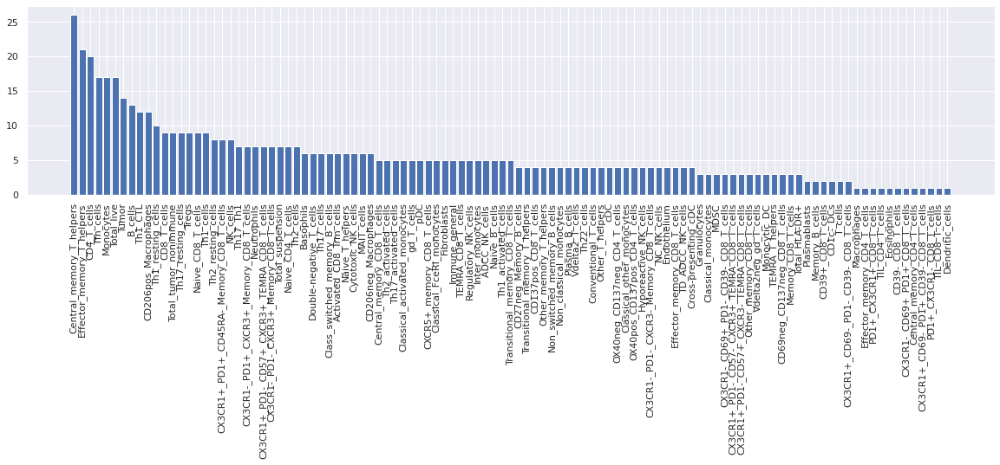

In [50]:
# a little bit of statistics
#example: which cell types do we have in lab_cells_annot?
plt.figure(figsize=(20, 4))
x = lab_cells_annot['Cell_type'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

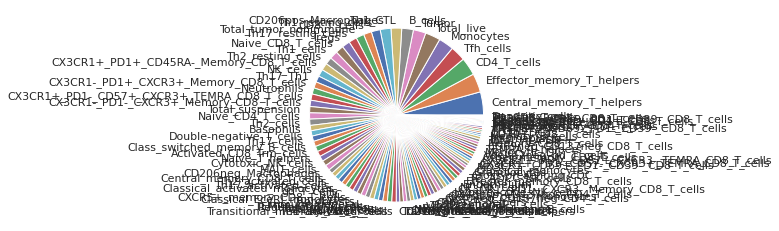

In [51]:
plt.pie(x, labels=x.index)
plt.show()

## read expressions

In [52]:
lab_cells_expr = read_expressions(lab_cells_annot)

In [53]:
lab_cells_expr = np.log2(lab_cells_expr+1)

## define custom signature

In [55]:
#signature_of_interest = '''IGKC	IGHM	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22',
'FCRL1',
'KLHL14',
'TNFRSF13B']

#add here a custon signature name
signature_name = 'B cell activation'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

## Validation itself

In [56]:
#define celltypes of interest
categories = ['Naive_B_cells', 
              'Secreting_B_cells', 
              'Class_switched_memory_B_cells', 
              'Non_switched_memory_B_cells', 
              'B_cells', 
              'CD27neg_Memory_B_cells', 
              'Memory_B_cells', 
              'NK_cells', 
              'Monocytes',
              'Neutrophils',
              'Basophils',
              'CD8_T_cells',
              'CD4_T_cells',
              'Fibroblasts',
              'Endothelium',
              'Tumor']

#dataframe subsetting
annot = pd.DataFrame()
for i in categories:
    annot = pd.concat([annot, lab_cells_annot.loc[lab_cells_annot['Cell_type'].isin([i])]])

#for sorting in the required order, could be skipped if the sorting is not needed
annot.Cell_type = pd.Categorical(annot['Cell_type'],
                                    categories=categories,
                                    ordered=True)
annot = annot.sort_values('Cell_type')

In [57]:
subsampling_lab = [i[1].sample(np.min([5, i[1].shape[0]])).index.tolist() for i in annot.groupby('Cell_type')]

In [58]:
subsampling_lab = [item for sublist in subsampling_lab for item in sublist]

<AxesSubplot:xlabel='Cell_type'>

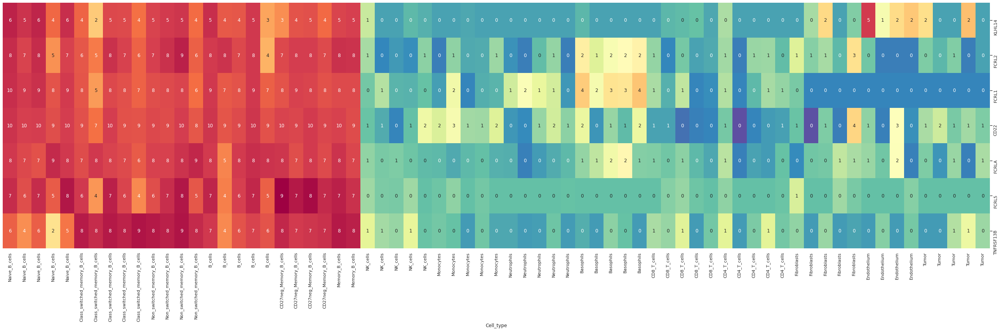

In [59]:
# A simple heatmap with log2 TPM of subsampled cells from celltypes of interest
genes_heatmap(
    lab_cells_expr[subsampling_lab],
    annot.reindex(subsampling_lab)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

In [70]:
# A simple heatmap with log2 TPM of all cells of current celltype
c = ['B_cells']
subsampling_lab = annot[annot['Cell_type'].isin(c)].index

genes_heatmap(
    public_cells_expr[subsampling_lab],
    annot.reindex(subsampling_lab)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

KeyError: "None of [Index(['RNASeq-normal-210108-NovaB_Sample23', '210514_NovaA_Sample_94',\n       'RNASeq-tumor-211209_NovaA_Sample_13',\n       'RNASeq-normal-201202_Next_Sample3',\n       'RNASeq-normal-210108-NovaB_Sample22', '210514_NovaA_Sample_5',\n       'RNASeq-tumor-210422_NovaB_Sample_17',\n       'RNASeq-normal-201117_NovaB_Sample19',\n       'RNASeq-normal-210108-NovaB_Sample17',\n       'RNASeq-tumor-210302-NovaA_Sample_27', '210514_NovaA_Sample_70',\n       '210514_NovaA_Sample_34', 'RNASeq-tumor-210423_NovaB_Sample_13'],\n      dtype='object', name='Sample')] are in the [columns]"

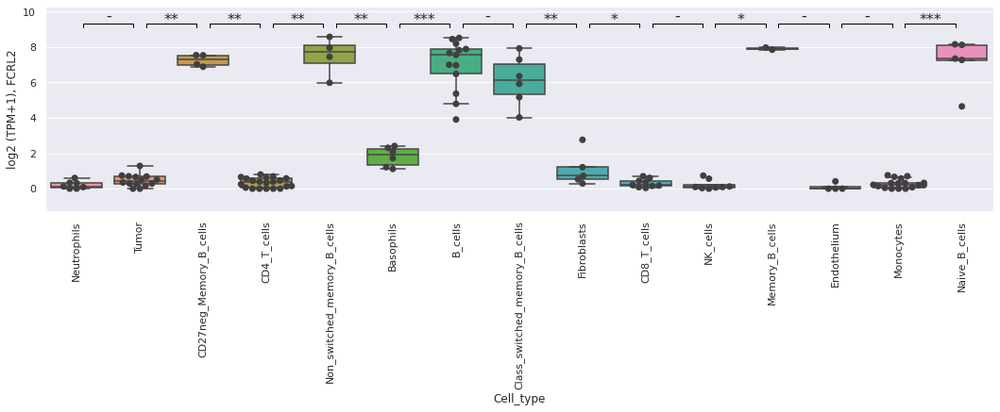

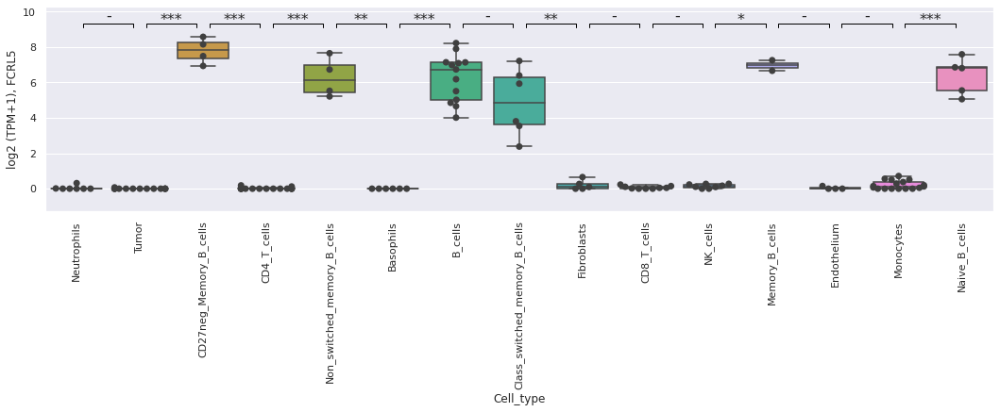

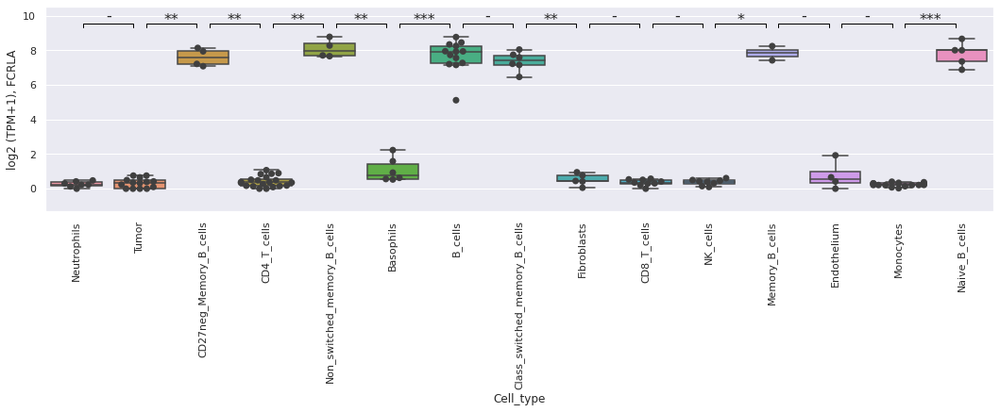

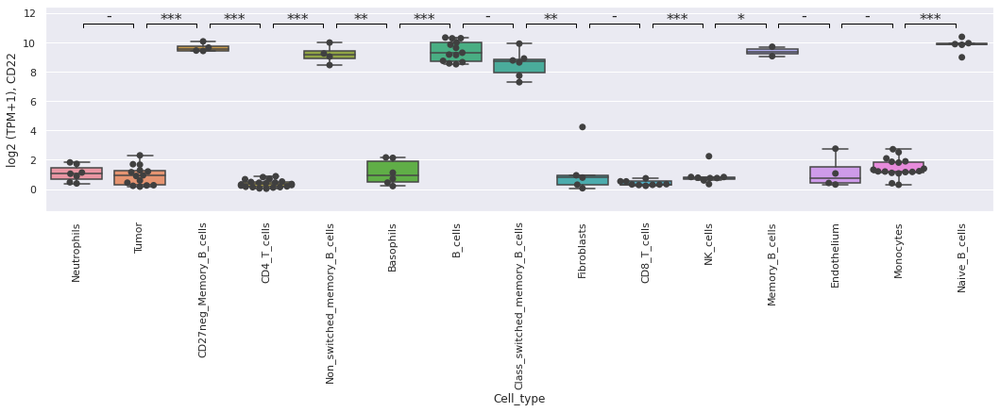

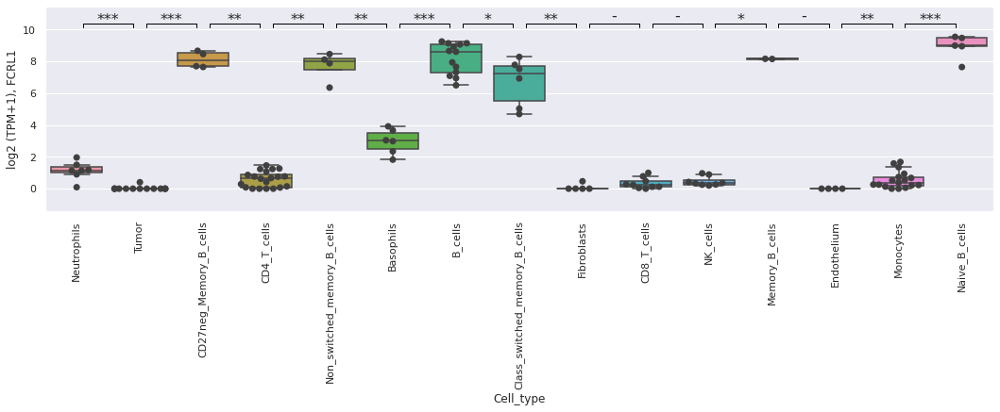

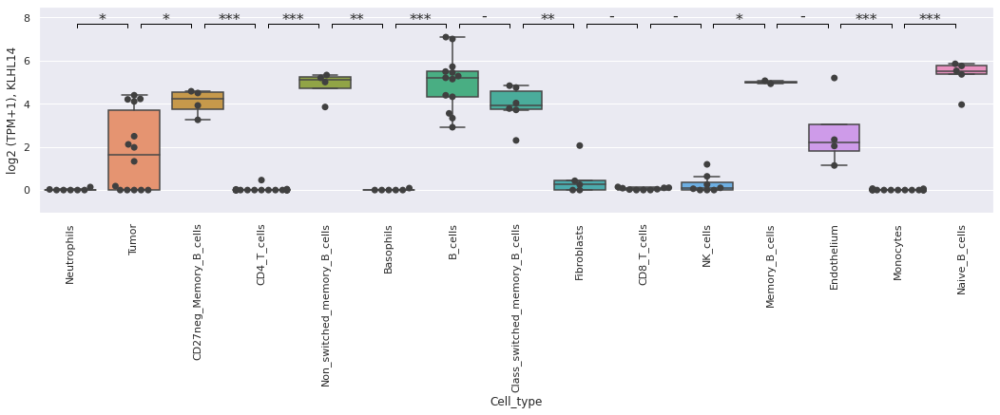

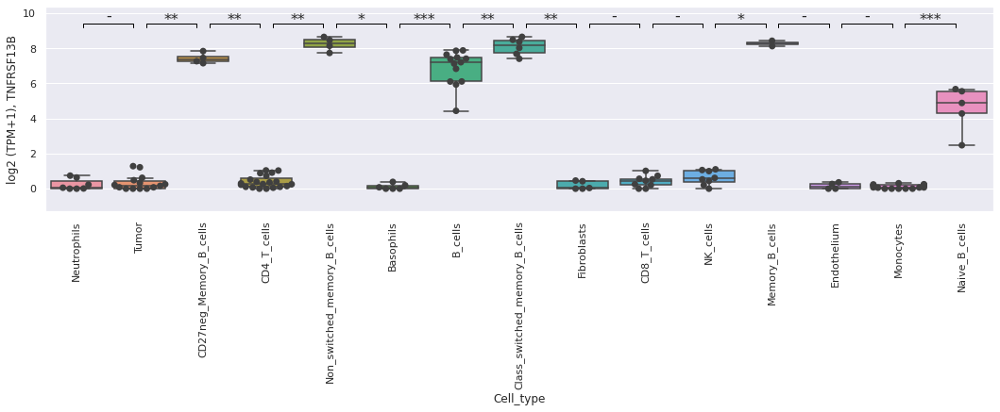

In [61]:
# boxplots depicting signature genes expression in celltypes of interest

categories = ['Naive_B_cells', 
              'Secreting_B_cells', 
              'Class_switched_memory_B_cells', 
              'Non_switched_memory_B_cells', 
              'B_cells', 
              'CD27neg_Memory_B_cells', 
              'Memory_B_cells', 
              'NK_cells', 
              'Monocytes',
              'Neutrophils',
              'Basophils',
              'CD8_T_cells',
              'CD4_T_cells',
              'Fibroblasts',
              'Endothelium',
              'Tumor'             
]

for gene in signature_of_interest:
    boxplot_with_pvalue(lab_cells_expr.loc[gene], annot[annot['Cell_type'].isin(categories)]['Cell_type'])
    plt.ylabel(f'log2 (TPM+1), {gene}')
    plt.xticks(rotation=90)
    plt.show()

In [67]:
lab_cells_ssgsea_unscaled = ssgsea_formula(lab_cells_expr, gmt_genes_alt_names(geneset_of_interest, lab_cells_expr.index, verbose=False)).T

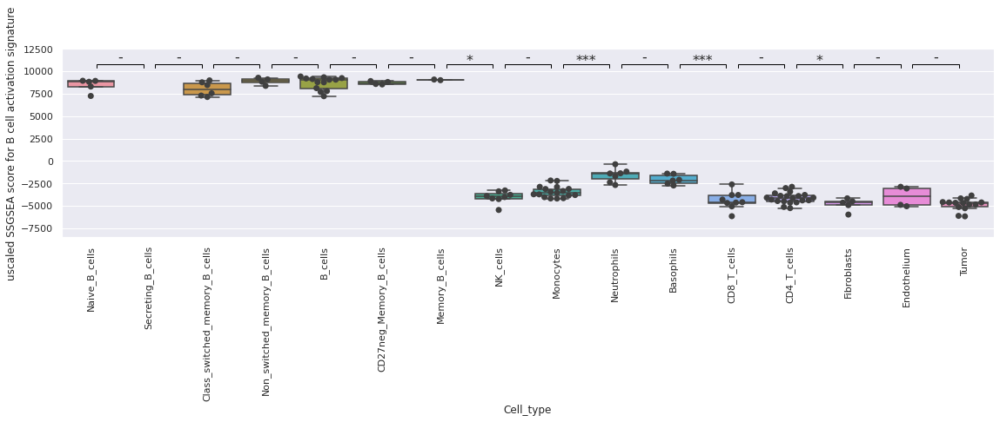

In [68]:
# boxplot depicting signature SSGSEA score in celltypes of interest

categories = ['Naive_B_cells', 
              'Secreting_B_cells', 
              'Class_switched_memory_B_cells', 
              'Non_switched_memory_B_cells', 
              'B_cells', 
              'CD27neg_Memory_B_cells', 
              'Memory_B_cells', 
              'NK_cells', 
              'Monocytes',
              'Neutrophils',
              'Basophils',
              'CD8_T_cells',
              'CD4_T_cells',
              'Fibroblasts',
              'Endothelium',
              'Tumor'              
]

boxplot_with_pvalue(lab_cells_ssgsea_unscaled[signature_name], annot[annot['Cell_type'].isin(categories)]['Cell_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'uscaled SSGSEA score for {signature_name} signature')
plt.show()

# Signature validation: Cancer cell lines

## read anno

In [73]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [74]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/cancer_cell_lines_all_annotation.tsv')

In [75]:
cells_clean = cells_clean[['Tumor_type', 'Dataset', 'Sample', 'Therapy']]

In [76]:
cancer_cells_annot = cells_clean.copy()

## anno stats

In [77]:
pd.options.display.max_rows = len(cancer_cells_annot['Tumor_type'].value_counts())
cancer_cells_annot['Tumor_type'].value_counts()

Lung_Adenocarcinoma                                  886
Prostate_Cancer                                      553
Pancreatic_Ductal_Adenocarcinoma                     269
Melanoma                                             247
Invasive_Breast_Carcinoma                            188
Acute_Myeloid_Leukemia                               186
EBV-B_cells                                          185
Large_Cell_Lung_Carcinoma                            181
Diffuse_Large_B_Cell_Lymphoma                        176
Mantle_Cell_Lymphoma                                 167
Cutaneous_Melanoma                                   126
Squamous_Cell_Carcinoma_of_the_Head_and_Neck         121
Chronic_Lymphocytic_Leukemia                         114
Colon_Adenocarinoma                                  102
Breast_Adenocarcinoma                                 95
Colon_Carinoma                                        94
Breast_Neoplasm                                       87
Glioblastoma                   

In [78]:
pd.options.display.max_rows = 10

In [79]:
cancer_cells_annot.head()

,Tumor_type,Dataset,Sample,Therapy
SRX4143039,Small_Cell_Lung_Carcinoma,GSE115122,SRX4143039,Without_therapy
SRX2495594,Diffuse_Large_B_Cell_Lymphoma,GSE93675,SRX2495594,Without_therapy
SRX3506075,Lung_Adenocarcinoma,GSE108464,SRX3506075,Without_therapy
SRX2314325,Diffuse_Large_B_Cell_Lymphoma,GSE89339,SRX2314325,Without_therapy
SRX2035865,Multiple_Myeloma,GSE85840,SRX2035865,Without_therapy


In [80]:
pd.crosstab(cancer_cells_annot.Tumor_type, cancer_cells_annot.Therapy)

Therapy,BRAFi,BRAFi+MEKi,BTK inhibitor (Ibrutinib),Day_10_of_PBS,Day_10_of_Ribavarin_80mg/kg/twice daily intraperitoneally,Lck inhibitor,No_data,Without_therapy,previously treated for non-Hodgkin lymphoma (NHL),"rituximab dosed 25 mg/kg, three times a week over 21 days."
Tumor_type,,,,,,,,,,
Acute_Erythroid_Leukemia,0,0,0,0,0,0,6,0,0,0
Acute_Lymphoblastic_Leukemia,0,0,0,0,0,0,0,42,0,0
Acute_Monocytic_Leukemia,0,0,0,0,0,0,0,20,0,0
Acute_Myeloid_Leukemia,0,0,0,0,0,0,0,186,0,0
Adenosquamous_Cell_Lung_Carcinoma,0,0,0,0,0,0,0,4,0,0
...,...,...,...,...,...,...,...,...,...,...
hESC,0,0,0,0,0,0,1,0,0,0
mesenchymal stem cells day 1,0,0,0,0,0,0,1,0,0,0
mesenchymal stem cells day 3,0,0,0,0,0,0,1,0,0,0


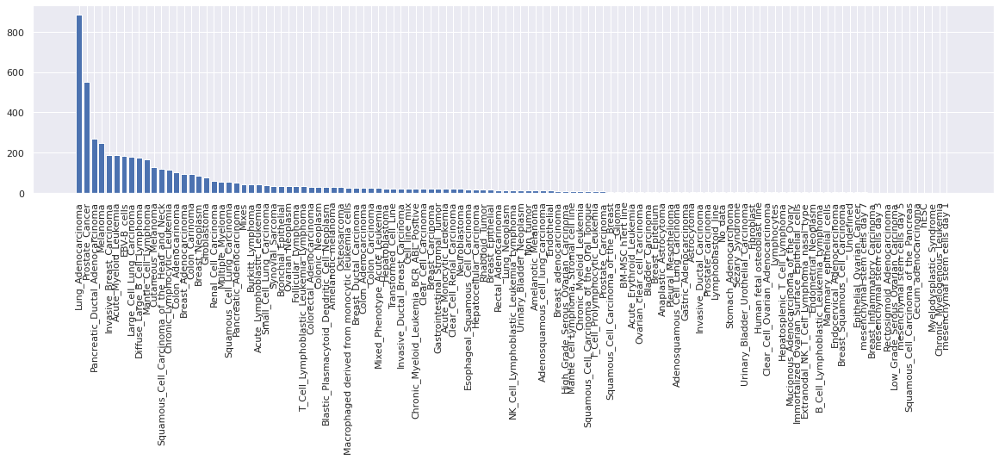

In [81]:
# a little bit of statistics
#example: which cell types do we have in cancer_cells_annot?
plt.figure(figsize=(20, 4))
x = cancer_cells_annot['Tumor_type'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

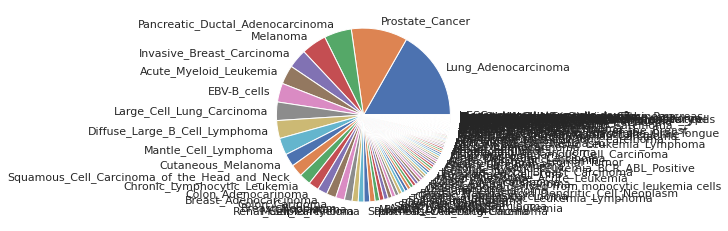

In [82]:
plt.pie(x, labels=x.index)
plt.show()

## read expressions

In [83]:
cancer_cells_expr = read_expressions(cancer_cells_annot)

In [84]:
cancer_cells_expr = np.log2(cancer_cells_expr+1)

## define custom signature

In [85]:
#signature_of_interest = '''IGKC	IGHM	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22',
'FCRL1',
'KLHL14',
'TNFRSF13B']

#add here a custon signature name
signature_name = 'B cell activation'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

## Validation itself

In [86]:
#define diagnoses of interest
categories = ['Lung_Adenocarcinoma',
'Prostate_Cancer', 
'Pancreatic_Ductal_Adenocarcinoma', 
'Melanoma']

#dataframe subsetting
annot = pd.DataFrame()
for i in categories:
    annot = pd.concat([annot, cancer_cells_annot.loc[cancer_cells_annot['Tumor_type'].isin([i])]])

#for sorting in the required order, could be skipped if the sorting is not needed
annot.Cell_type = pd.Categorical(annot.Tumor_type,
                                    categories=categories,
                                    ordered=True)
annot = annot.sort_values('Tumor_type')

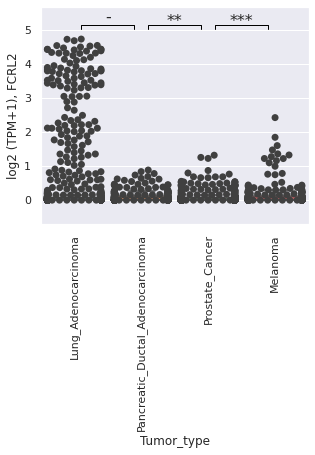

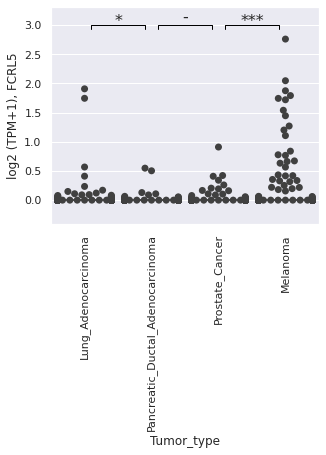

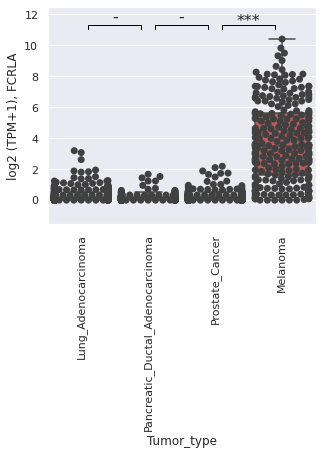

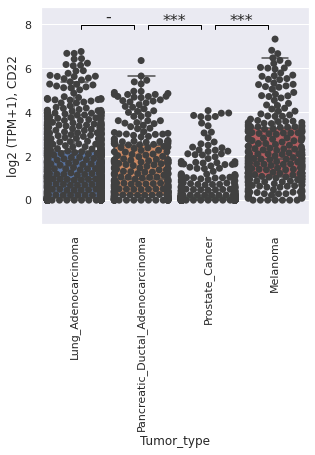

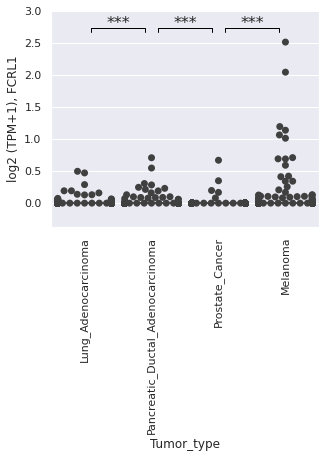

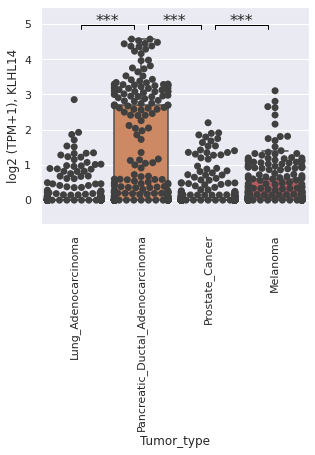

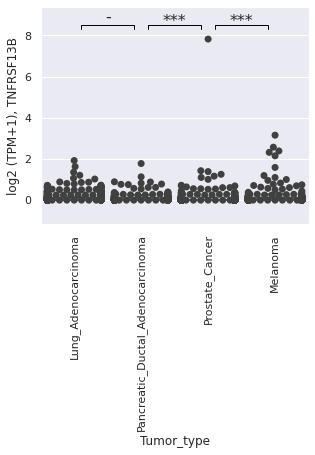

In [90]:
# boxplots depicting signature genes expression in diagnoses of interest

categories = ['Lung_Adenocarcinoma',
'Prostate_Cancer', 
'Pancreatic_Ductal_Adenocarcinoma', 
'Melanoma'           
]

for gene in signature_of_interest:
    boxplot_with_pvalue(cancer_cells_expr.loc[gene], annot[annot['Tumor_type'].isin(categories)]['Tumor_type'])
    plt.ylabel(f'log2 (TPM+1), {gene}')
    plt.xticks(rotation=90)
    plt.show()

In [91]:
cancer_cells_ssgsea_unscaled = ssgsea_formula(cancer_cells_expr, gmt_genes_alt_names(geneset_of_interest, cancer_cells_expr.index, verbose=False)).T

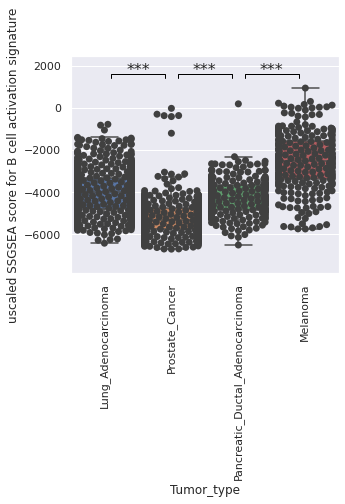

In [92]:
# boxplot depicting signature SSGSEA score in celltypes of interest

categories = ['Lung_Adenocarcinoma',
'Prostate_Cancer', 
'Pancreatic_Ductal_Adenocarcinoma', 
'Melanoma'           
]

boxplot_with_pvalue(cancer_cells_ssgsea_unscaled[signature_name], annot[annot['Tumor_type'].isin(categories)]['Tumor_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'uscaled SSGSEA score for {signature_name} signature')
plt.show()

# Signature validation: Blood db

## read anno

In [115]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [116]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/blood_all_annotation.tsv')

In [117]:
cells_clean.head()

,Readcounts,Sample,Dataset,Sample_type,Sample_type_details,Tissue_stimulation,Therapy_type,Globin_depletion_kit,Freezing,Diagnosis
SRX4780433,26449327.00,SRX4780433,GSE120691,Whole_blood,NaN,Without_stimulation,Without_therapy,No_data,-80,Healthy
SRX11208168,4274732.00,SRX11208168,GSE178757,Whole_blood,NaN,Hour_24 _of_SARS-CoV-2 peptide NP1_2 ug/mL(80u...,No_data,No_data,No,COVID-19
SRX6368870,683021.30,SRX6368870,GSE133378,Whole_blood,NaN,Without_stimulation,No_data,GlobinLock,No_data,Juvenile_idiopathic_arthritis
SRX10280085,5650398.00,SRX10280085,GSE168519,Whole_blood,NaN,Without_stimulation,No_data,No_data,No_data,"Tuberculosis, HIV"
SRX2683349,19434751.02,SRX2683349,GSE97158,Whole_blood,NaN,Without_stimulation,25000 infectious Plasmodium falciparum sporozo...,GLOBINclear (Thermo Fisher Scientific),-80,Controlled_human_malaria_infection


In [118]:
blood_annot = cells_clean.copy()

In [119]:
cells_clean = cells_clean[['Sample_type', 'Dataset', 'Sample', 'Therapy_type', 'Diagnosis']]

In [122]:
blood_annot = cells_clean.copy()

In [123]:
blood_annot = blood_annot[~blood_annot.index.duplicated()]

## Definition of custom signature (once again, same as above)

In [124]:
#signature_of_interest = '''IGLL3P	IGKC	IGHM	GUSBP11	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22',
'FCRL1',
'KLHL14',
'TNFRSF13B']

#add here a custon signature name (as a first input)
signature_name = 'B cell activation'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

In [125]:
blood_annot

,Sample_type,Dataset,Sample,Therapy_type,Diagnosis
SRX4780433,Whole_blood,GSE120691,SRX4780433,Without_therapy,Healthy
SRX11208168,Whole_blood,GSE178757,SRX11208168,No_data,COVID-19
SRX6368870,Whole_blood,GSE133378,SRX6368870,No_data,Juvenile_idiopathic_arthritis
SRX10280085,Whole_blood,GSE168519,SRX10280085,No_data,"Tuberculosis, HIV"
SRX2683349,Whole_blood,GSE97158,SRX2683349,25000 infectious Plasmodium falciparum sporozo...,Controlled_human_malaria_infection
...,...,...,...,...,...
SRX2633958,Whole_blood,GSE96083,SRX2633958,No_data,Pregnancy
SRX10056703,PBMC,GSE166409,SRX10056703,No_data,Thrombocytopenia_2
SRX2314580,Whole_blood,GSE89403,SRX2314580,Chemotherapeutic,Tuberculosis
SRX7495962,Plasma,GSE142987,SRX7495962,Without_therapy,Liver_Neoplasm


In [126]:
# подсчет колличества образцов разных диагнозов в blood db
available_diagnoses = blood_annot.Diagnosis.unique()
with pd.option_context('display.max_rows', None):
    display(blood_annot.Diagnosis.value_counts())

Healthy                                                                      11483
Tuberculosis                                                                  2134
COVID-19                                                                      1203
Type_1_diabetes_mellitus                                                      1068
Systemic_lupus_erythematosus                                                   818
Asthma                                                                         725
Post-traumatic_stress_disorder                                                 448
HIV                                                                            380
Rheumatoid_arthritis                                                           350
Sepsis                                                                         318
Controlled_human_malaria_infection                                             289
Juvenile_idiopathic_arthritis                                                  268
Zika

In [127]:
blood_annot.index = blood_annot['Sample']

In [128]:
#diagnoses to compare
diagnoses = ['Systemic_lupus_erythematosus', 'Healthy']

In [130]:
# подгружаем неподгруженные когорты
blood_expressions = {}
for d in diagnoses:
    if d not in blood_expressions.keys():
        blood_expressions[d] = np.log2(read_expressions(blood_annot[blood_annot['Diagnosis'] == d]) + 1)

## Validation itself

In [135]:
pd.concat(list(get_ranks(df)), axis=1).T

NameError: name 'df' is not defined

In [136]:
def gene_corr_plot(genes, df, diag):
#     display(genes)
    clustered_heatmap(df.reindex(genes), title=diag, metric='spearman', vmin=0, vmax=1);
    df_ranks = pd.concat(list(get_ranks(df)), axis=1).T
    df_ranks = df_ranks.reindex(genes)
    order = df_ranks.sum().sort_values(ascending=False).index
    df_ranks = df_ranks.reindex(order, axis=1)
    _, ax = plt.subplots(figsize=(15,4))
    sns.heatmap(
        df_ranks.reindex(get_hclust_order(df_ranks, metric='spearman')), 
        cbar=False, cmap='coolwarm', xticklabels=False, ax=ax
    );
    df = df.reindex(genes)
    data = pd.melt(df.T)
    data['KDE'] = 'Gene'


    data2 = \
    pd.Series(
        data=list(it.chain.from_iterable(it.repeat(df.mean(), len(df.index)))),
        index=list(it.chain.from_iterable(it.repeat(x, len(df.columns)) for x in df.index)),
        name='value'
    )

    data2 = data2.reset_index().rename(columns={'index': 'Gene'})

    data2['KDE'] = 'Mean'

    _, ax = plt.subplots(figsize=(len(df.index)*1.5,5))

    ax2 = sns.violinplot(
        x='Gene',
        y='value',
        hue='KDE',
        data=pd.concat([data, data2]),
        palette="Set2",
        split=True,
        scale="count",
        inner='box',
        ax=ax
    )
    ax2.set_xticklabels(ax.get_xticklabels(), rotation=45);
    plt.show()

Signature name: B cell activation
Diagnosis(es): Systemic_lupus_erythematosus


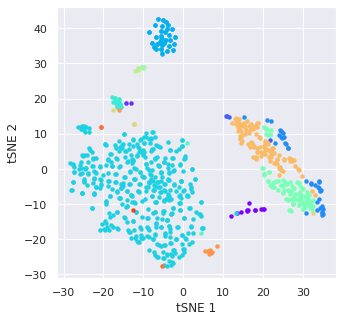

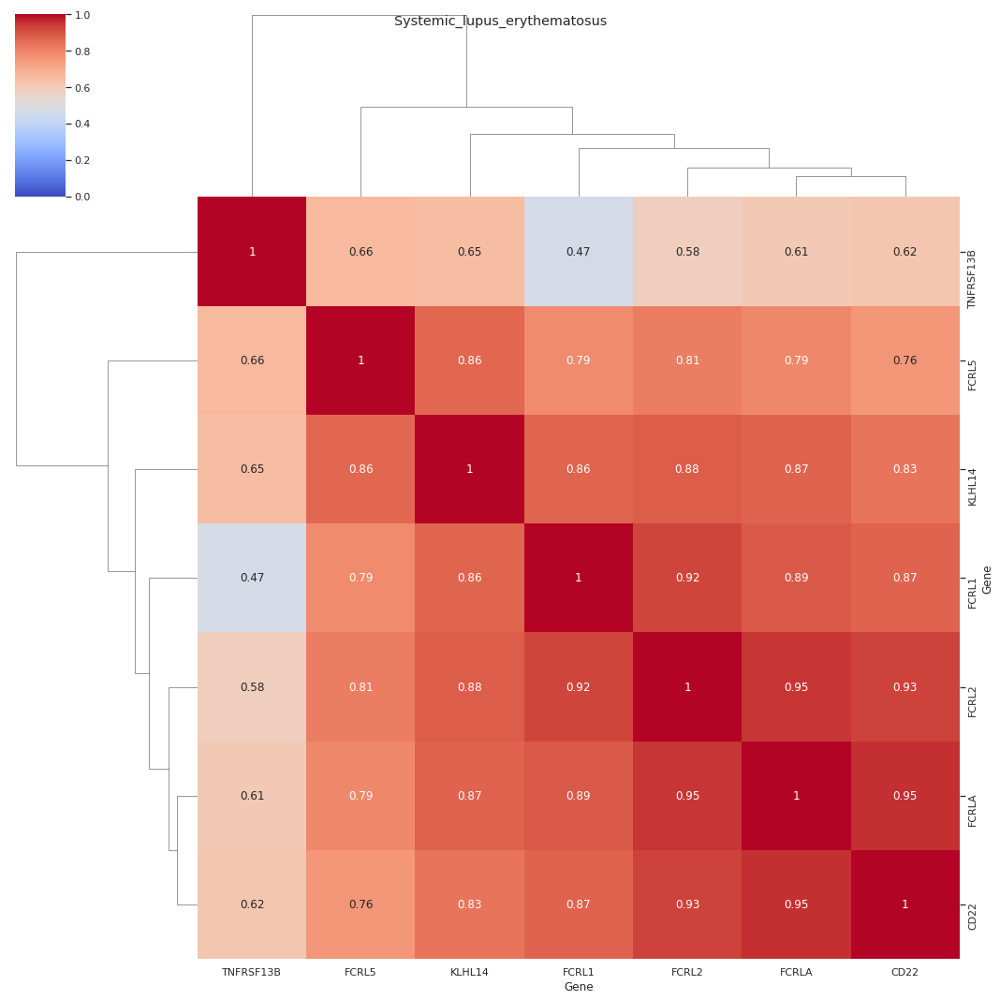

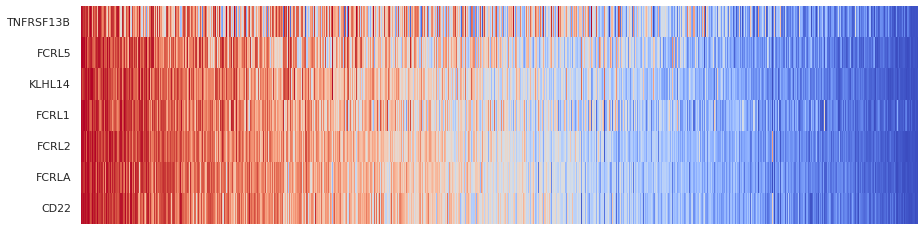

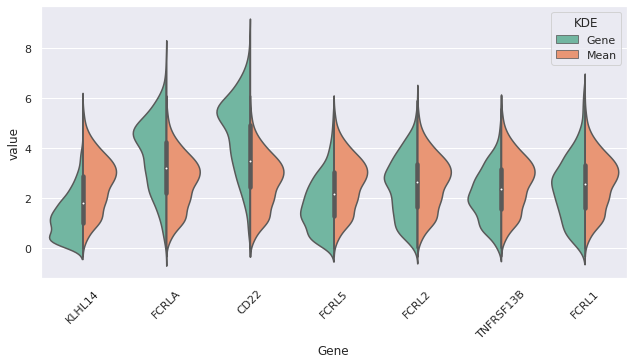

Diagnosis(es): Healthy


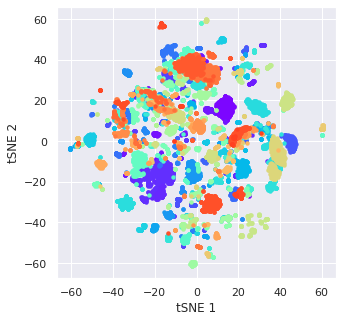

ValueError: cannot reindex from a duplicate axis

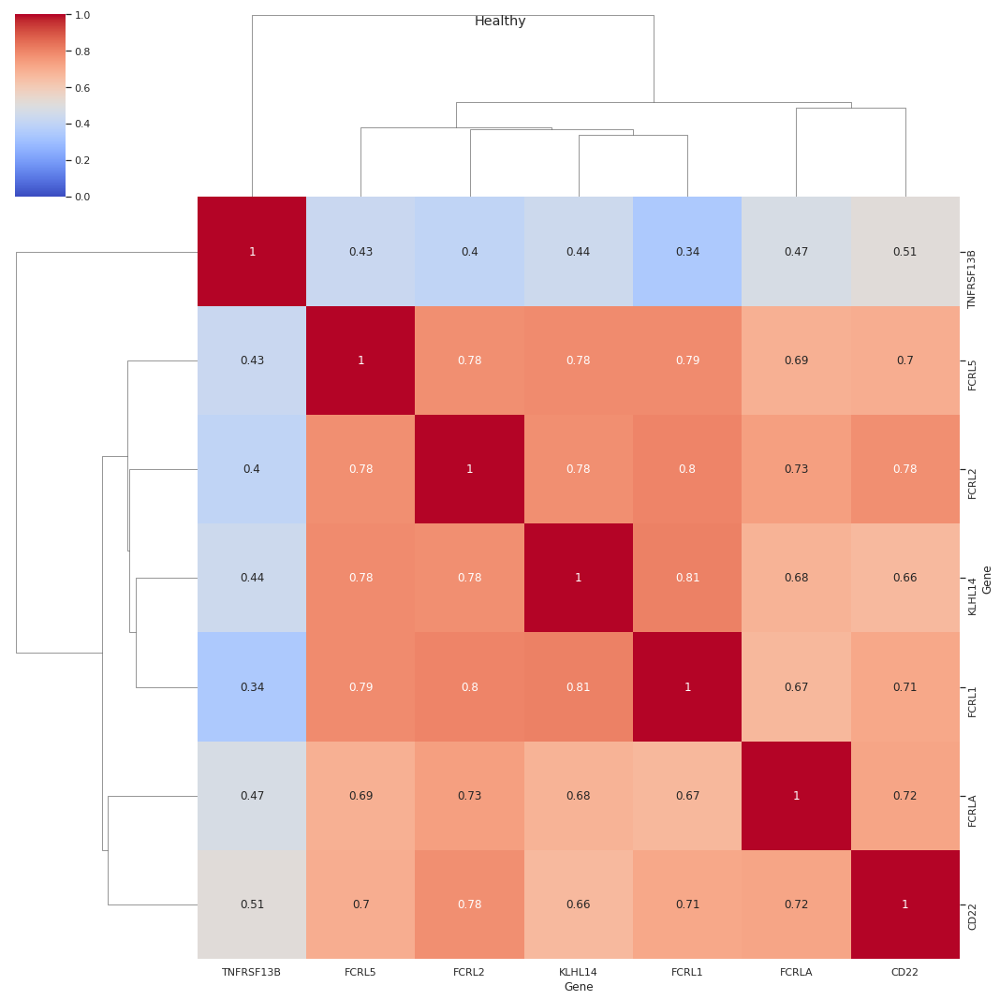

In [137]:
for sign_name, geneset in geneset_of_interest.items():
    print(f'Signature name: {sign_name}')
    df = pd.DataFrame()
    for diag in diagnoses:
        print('Diagnosis(es):', diag)
        if isinstance(diag, list):
            df = pd.concat([blood_expressions[d] for d in diag], axis=1).dropna()
        else:
            df = blood_expressions[diag].dropna()
        df.index.name = 'Gene'
        dft = df.T
        tsne_plot(dft, legend=False, grouping = blood_annot['Dataset'])
        plt.show()
        gene_corr_plot(list(geneset.genes), df, diag)
        #sns.heatmap(dft.T.corr(method='spearman'), cmap=default_cmap, vmin=0, vmax=1)
        plt.show()
    print('='* 50)

# Signature validation: pancan data

### Definition of custom signature (once again, same as above)

In [138]:
#signature_of_interest = '''IGKC	IGHM	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22',
'FCRL1',
'KLHL14',
'TNFRSF13B']

#add here a custon signature name (as a first input)
signature_name = 'B cell activation'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

In [139]:
#list all cohorts with expressions available
os.listdir('/uftp/mvp-data/cohorts/')

['FL-FFPE',
 'WU_ccRCC_RCCTC',
 'PAAD',
 'UCEC',
 'FL-EC-NuGEN',
 'PRAD',
 'Pancreatic_NET',
 'UCS',
 'LUSC',
 'PTCL_LN',
 'TCGA-BRCA_LumiNorm',
 'CTCL',
 'UVM',
 'PUB_BG_Healthy_PBMC',
 'AML',
 'SKCM',
 'THCA',
 'TCGA-COREAD',
 'KIRC',
 'MESO',
 'TCGA-CESC_SCC',
 'TCGA-CESC_AC',
 'CLL-polyA',
 'TGCT',
 'BLCA',
 'PCPG',
 'CSCC-polyA',
 'KIRP',
 'Leiomyosarcoma',
 'Liposarcoma',
 'PUB_MM_TCGA_MMRF_NOT_FOR_PRODUCT',
 'OV-total',
 'SARC_Pediatric',
 'LUAD',
 'KICH',
 'THYM',
 'FL-polyA',
 'PanSolid',
 'custom_normal_ln',
 'LIHC',
 'ACC',
 'CHOL',
 'THYM_without_TC',
 'SARC',
 'DLBCL-polyA',
 'TCGA-BRCA_Basal',
 'TCGA-Astrocytoma',
 'HNSC-total',
 'TCGA-HNE_SCC',
 'OV',
 'TCGA-Oligodendroglioma',
 'COAD-total',
 'Whole_blood_healthy',
 'PTCL_blood',
 'AdCC',
 'deconvolution',
 'uftp',
 'TCGA-Glioblastoma',
 'TCGA-BRCA_Her2',
 'TCGA-ESGA_AC']

In [140]:
#list all cohorts with counts available
os.listdir('/uftp2/Datasets/Xena/TCGA/TCGA_Kallisto_genes_est_counts_without_noncoding/')

['remaining_est_counts_sum',
 'CHOL_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'PAAD_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'UVM_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'THYM_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'DLBC_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'ACC_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'STAD_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'ESCA_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'CESC_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'COAD_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'MESO_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'KIRP_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'THCA_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'PCPG_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz',
 'SKCM_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz'

In [141]:
cohorts = ['THYM',
 'PRAD',
 'ACC',
 'KIRC',
 'LIHC',
 'BLCA',
 'LUAD',
 'KICH',
 'SARC',
 'KIRP',
 'LUSC',
 'THCA',
 'PCPG',
 'OV',
 'PAAD',
 'UVM',
 'SKCM',
 'UCS',
 'UCEC',
 'MESO']

In [142]:
tcga_expressions = {}
tcga_ssgsea ={}
tcga_ssgsea_unscaled = {}
tcga_deconv = {}
tcga_counts = {}


for cohort in tqdm(cohorts):
    e = get_expression_table(cohort, log=True).T
    s = ssgsea_formula(e, gmt_genes_alt_names(geneset_of_interest, e.index, verbose=False)).T
    tcga_expressions[cohort] = e
    tcga_ssgsea_unscaled[cohort] = s
    tcga_ssgsea[cohort] = median_scale(s)
    
    tcga_deconv[cohort] = get_deconv(cohort)
    tcga_counts[cohort] = read_dataset(f'/uftp2/Datasets/Xena/TCGA/TCGA_Kallisto_genes_est_counts_without_noncoding/{cohort}_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz')

  0%|          | 0/20 [00:00<?, ?it/s]

In [143]:
tcga_anno = read_dataset('/uftp2/Datasets/TCGA/current_version/data/annotation.tsv')
tcga_expressions = pd.concat(tcga_expressions.values(), axis=1)
tcga_ssgsea = pd.concat(tcga_ssgsea.values())
tcga_ssgsea_unscaled = pd.concat(tcga_ssgsea_unscaled.values())
tcga_deconv = pd.concat(tcga_deconv.values()).T
tcga_counts = pd.concat(tcga_counts.values(), axis=1)

### Check if all genes in signatures are expressed

In [146]:
from pathlib import Path
from typing import Union

import numpy as np
import pandas as pd

from bioreactor.utils import read_dataset


def generate_noise(sample: pd.Series, noise: pd.Series) -> pd.Series:
    return (sample + noise * np.random.normal(size=sample.shape)).clip(lower=0)


def calculate_sample_noise(sample: Union[pd.Series, pd.DataFrame],
                           readcounts: Union[float, pd.Series],
                           gene_lengths_file_path=Path('/uftp/gene_data_common/'
                                                       'gene_length_values.tsv'),
                           alpha=2.05 * 1000) -> Union[pd.Series, pd.DataFrame]:
    gene_length = read_dataset(gene_lengths_file_path)
    noise = alpha * np.sqrt(sample.T.divide(gene_length.loc[sample.columns, 'length'], axis='index') /
                            readcounts).T
    return noise.clip(lower=0)

In [147]:
from bioreactor.exp_noize import *

ModuleNotFoundError: No module named 'bioreactor.exp_noize'

In [149]:
?calculate_sample_noise

Below, we have an implementation of Noise model (developed by Ilia Cheremushkin)
WE HAVE PUBLICATION OMG

In [156]:
GENE_LENGTH = '/uftp/Deconvolution/training/config/gene_length_values.tsv'
ALPHA = 2.05 * 1000
gene_length = pd.read_csv(GENE_LENGTH, sep='\t', index_col=0)

def calculate_sample_noise(
    sample: pd.Series,
    readcounts: float,
    gene_length: pd.DataFrame = gene_length) -> pd.Series:
    noise = ALPHA * np.sqrt(sample.divide(gene_length.loc[sample.index, 'length'], axis='index') / readcounts)
    return noise.clip(lower=0)

In [157]:
tcga_expressions_for_noise, tcga_counts_for_noise = to_common_samples([tcga_expressions.T, tcga_counts.T])

In [158]:
noise_percent = calculate_sample_noise(np.exp(tcga_expressions_for_noise) - 1, tcga_counts_for_noise.sum(axis=1))

KeyError: "None of [Index(['TCGA-AX-A3G6-01', 'TCGA-FS-A4F2-06', 'TCGA-QR-A708-01',\n       'TCGA-DX-A7EL-01', 'TCGA-33-AASJ-01', 'TCGA-RW-A67V-01',\n       'TCGA-DF-A2KZ-01', 'TCGA-XU-AAXW-01', 'TCGA-29-1763-01',\n       'TCGA-CZ-5455-01',\n       ...\n       'TCGA-XK-AAJT-01', 'TCGA-E7-A5KE-01', 'TCGA-G7-7501-01',\n       'TCGA-EJ-5519-01', 'TCGA-DD-AACO-01', 'TCGA-ZF-AA58-01',\n       'TCGA-4X-A9FB-01', 'TCGA-GC-A4ZW-01', 'TCGA-EE-A2MH-06',\n       'TCGA-FY-A3WA-01'],\n      dtype='object', length=5499)] are in the [index]"

In [56]:
'''noise_percent = tcga_expressions_for_noise.apply(lambda x: 100*calculate_sample_noise(x, tcga_counts_for_noise.loc[x.name])/x, 
                                axis=1)'''

'noise_percent = tcga_expressions_for_noise.apply(lambda x: 100*calculate_sample_noise(x, tcga_counts_for_noise.loc[x.name])/x, \n                                axis=1)'

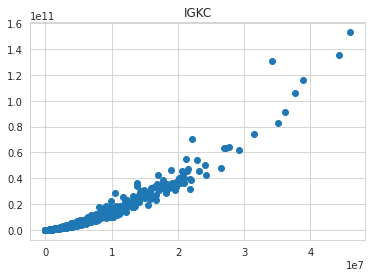

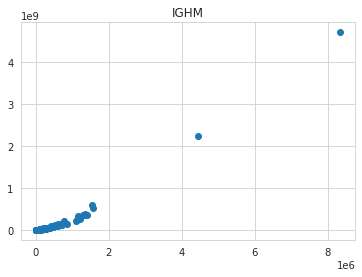

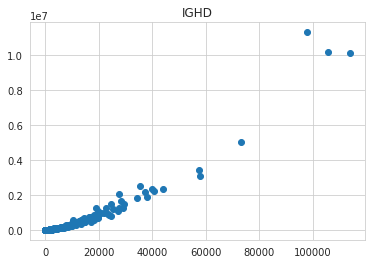

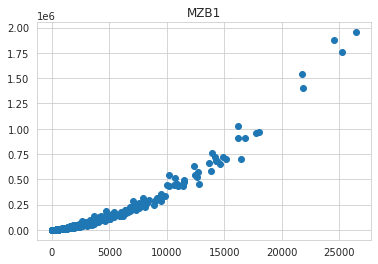

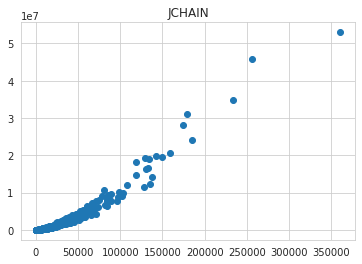

...

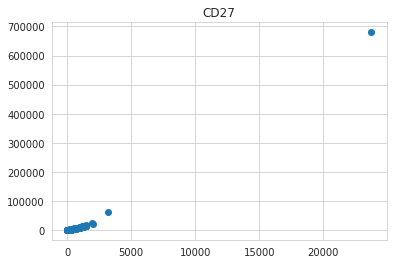

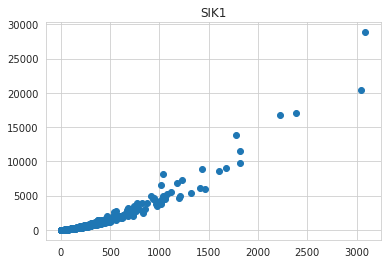

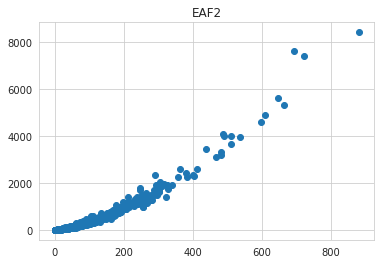

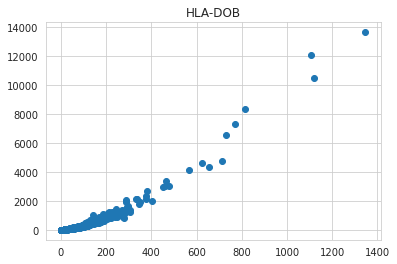

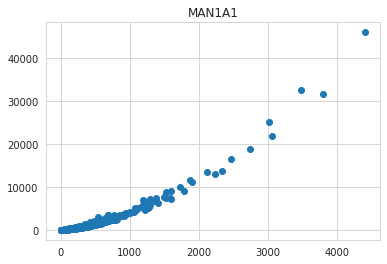

In [75]:
for gene in signature_of_interest:
    plt.scatter(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1, 
               noise_percent.T.loc[gene]*(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1))
    plt.title(gene)
    plt.show()

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


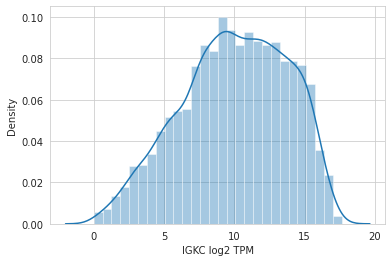

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


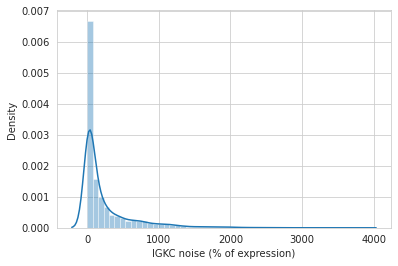

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


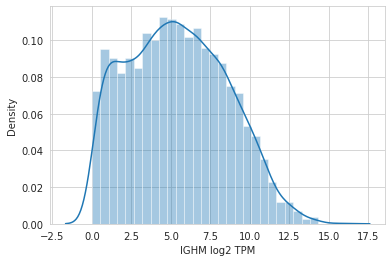

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


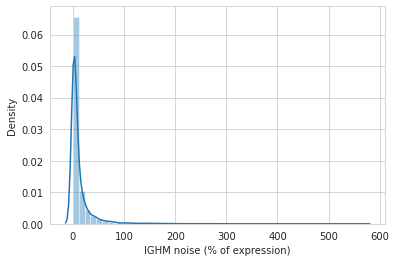

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


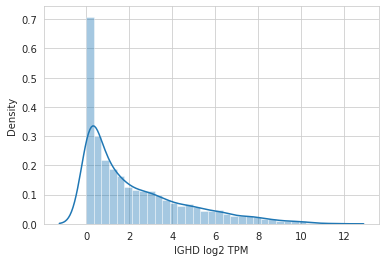

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


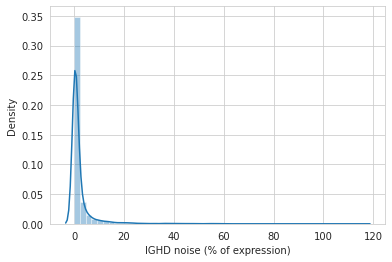

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


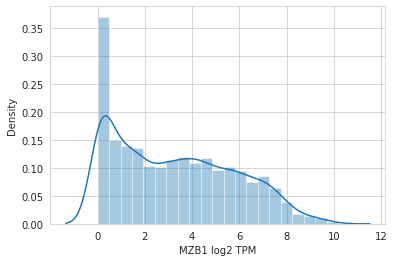

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


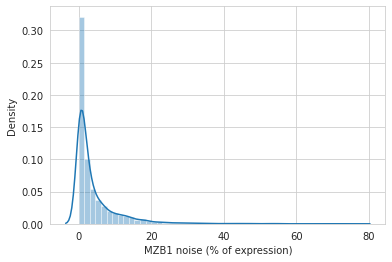

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


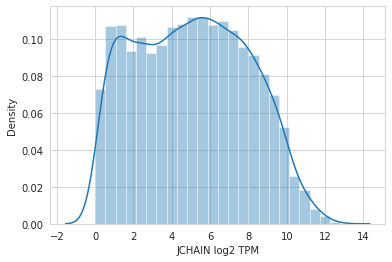

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


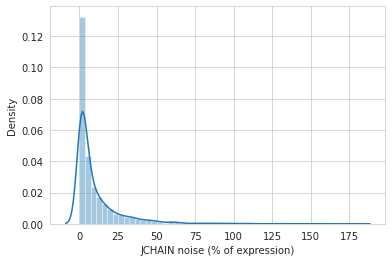

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


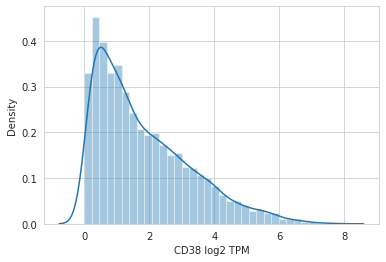

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


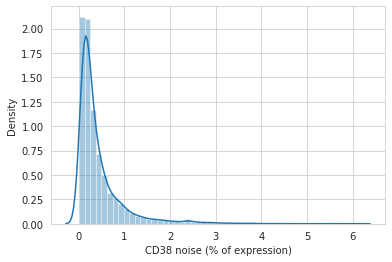

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


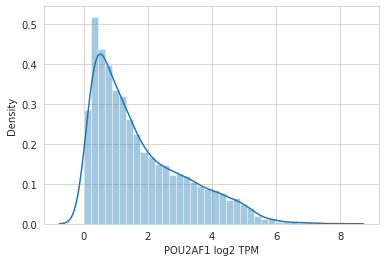

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


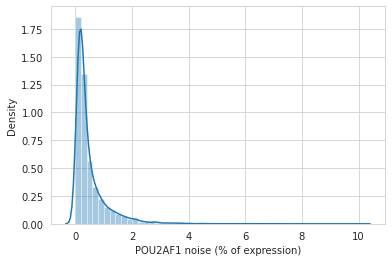

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


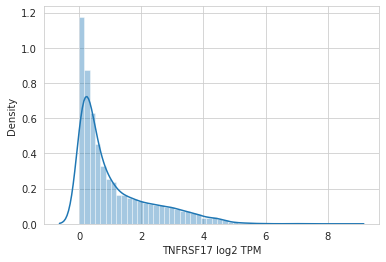

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


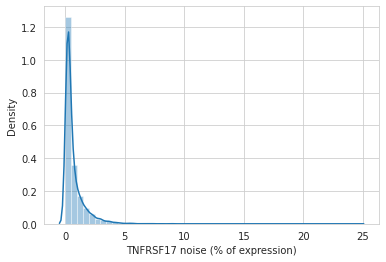

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


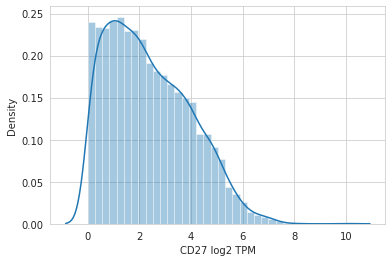

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


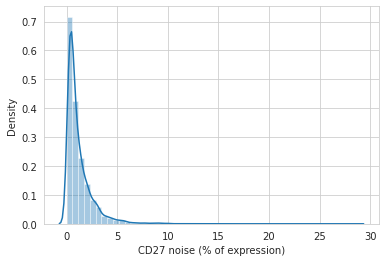

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


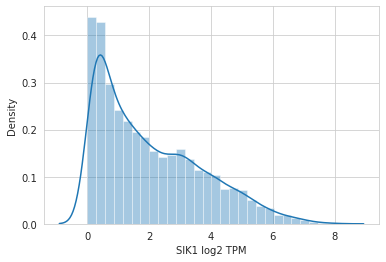

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


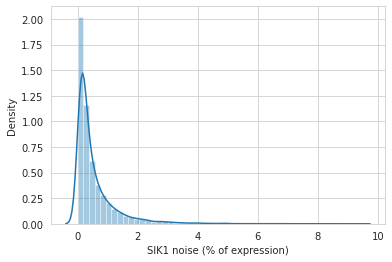

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


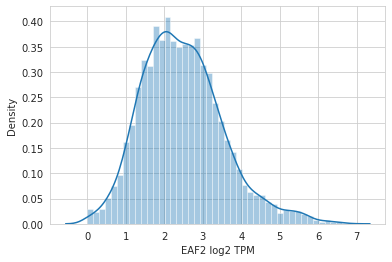

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


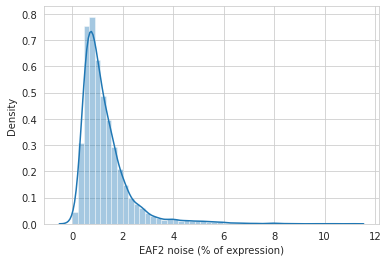

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


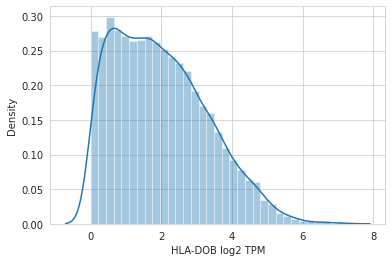

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


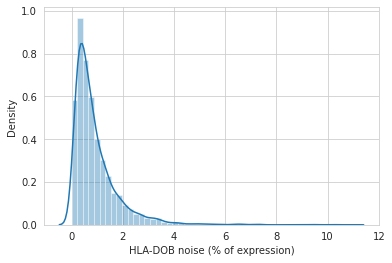

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


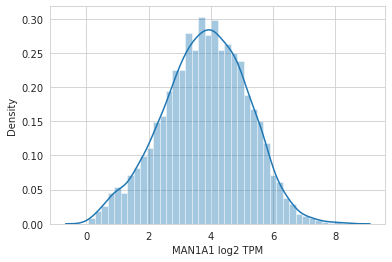

/home/eocheredko/venvs/bior_38/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


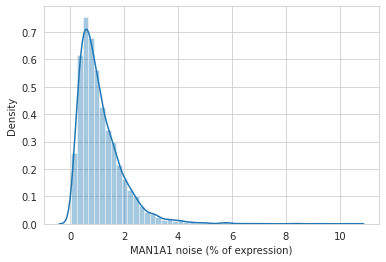

In [64]:
for gene in signature_of_interest:
    sns.distplot(tcga_expressions_for_noise.T.loc[gene])
    plt.xlabel(f'{gene} log2 TPM')
    plt.show()
    
    sns.distplot(noise_percent.T.loc[gene])
    plt.xlabel(f'{gene} noise (std)')
    plt.show()

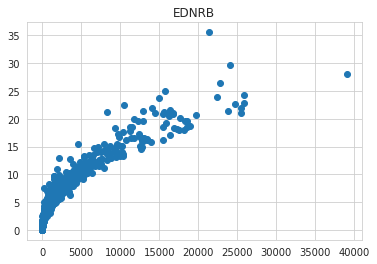

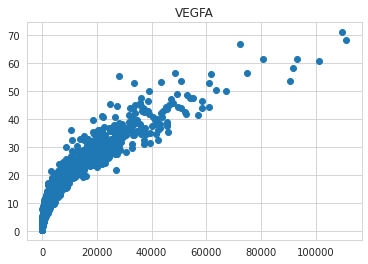

In [68]:
for gene in ['EDNRB', 'VEGFA']:
    plt.scatter(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1, noise_percent.T.loc[gene])
    plt.title(gene)
    plt.show()

In [70]:
noise_percent.T.loc[gene]

TCGA-ET-A3BU-01    0.000000
TCGA-DJ-A3UO-01    0.000000
TCGA-WB-A80V-01    0.000000
TCGA-BT-A3PH-01    0.260862
TCGA-X6-A8C4-01    0.000000
                     ...   
TCGA-68-A59J-01    2.682219
TCGA-DD-AACN-01    0.000000
TCGA-EJ-5517-01    0.000000
TCGA-DD-AAE4-01    0.376934
TCGA-EB-A3XD-01    0.000000
Name: CT83, Length: 5499, dtype: float64

In [72]:
(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1)

TCGA-ET-A3BU-01     0.000000
TCGA-DJ-A3UO-01     0.000000
TCGA-WB-A80V-01     0.000000
TCGA-BT-A3PH-01     0.392897
TCGA-X6-A8C4-01     0.000000
                     ...    
TCGA-68-A59J-01    35.854604
TCGA-DD-AACN-01     0.000000
TCGA-EJ-5517-01     0.000000
TCGA-DD-AAE4-01     0.444882
TCGA-EB-A3XD-01     0.000000
Name: CT83, Length: 5499, dtype: float64

In [73]:
noise_percent.T.loc[gene]*(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1)

TCGA-ET-A3BU-01     0.000000
TCGA-DJ-A3UO-01     0.000000
TCGA-WB-A80V-01     0.000000
TCGA-BT-A3PH-01     0.102492
TCGA-X6-A8C4-01     0.000000
                     ...    
TCGA-68-A59J-01    96.169909
TCGA-DD-AACN-01     0.000000
TCGA-EJ-5517-01     0.000000
TCGA-DD-AAE4-01     0.167691
TCGA-EB-A3XD-01     0.000000
Name: CT83, Length: 5499, dtype: float64

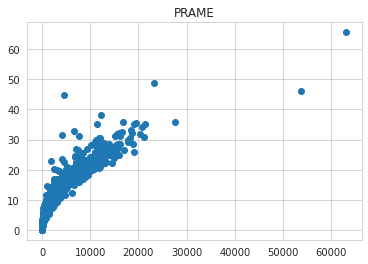

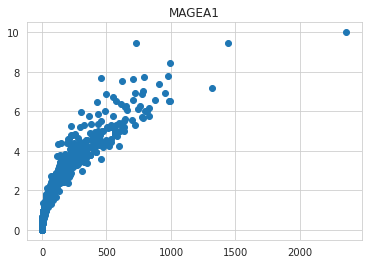

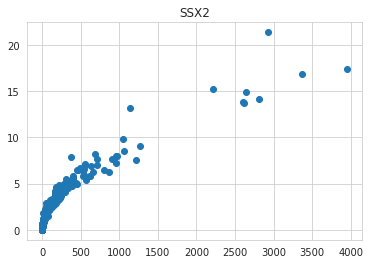

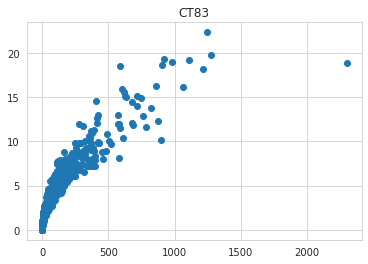

In [83]:
# bad genes example
for gene in ['PRAME', 'MAGEA1', 'SSX2', 'CT83']:
    plt.scatter(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1, 
                noise_percent.T.loc[gene])
    plt.title(gene)
    plt.show()

### Check if there are anticorrelating genes

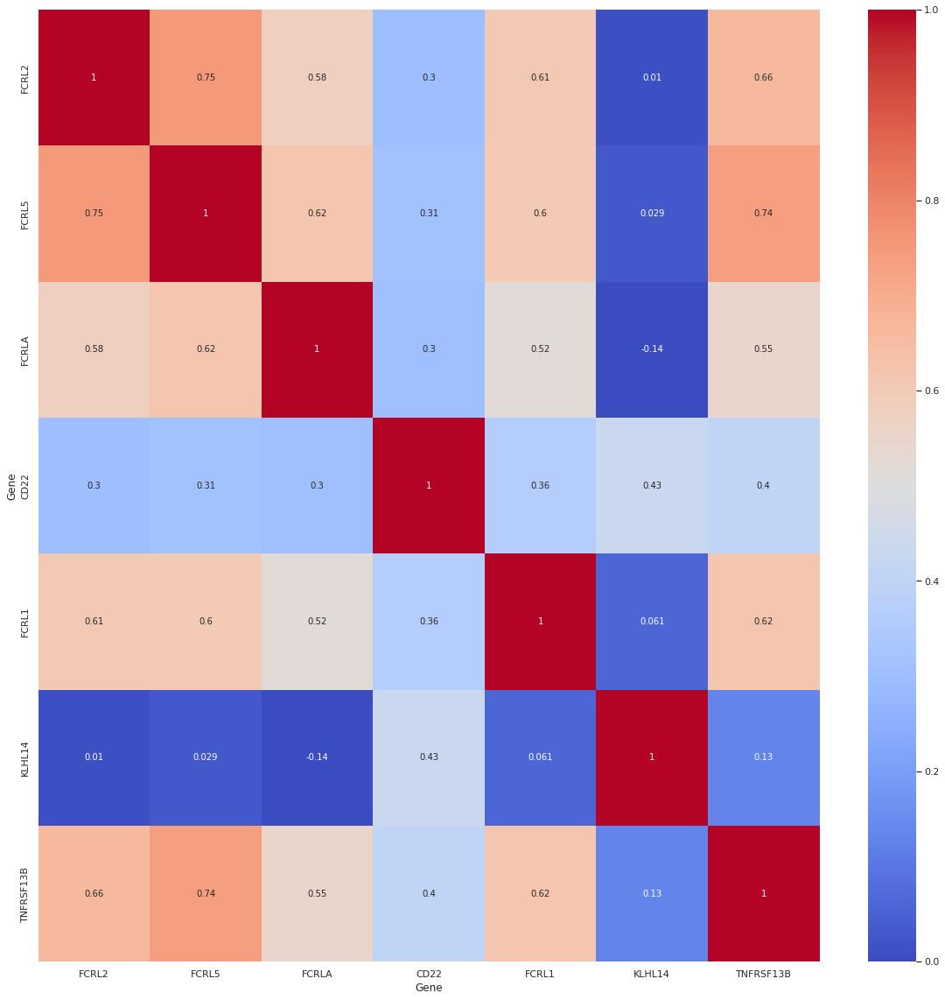

In [159]:
plt.figure(figsize=(20, 20))
sns.heatmap(tcga_expressions.T[signature_of_interest].corr(method='spearman'), cmap=default_cmap, annot=True, 
        annot_kws={"fontsize":10},
           vmin=0, vmax=1)
plt.show()

### Check if this signature overlaps/correlates with existing signatures from Chess DB

#### Load signatures from CHESS DB using GefestDAL

In [160]:
from gefest.requesters import AthenaRequester, AvicennaRequester, PandoraRequesterV2, GeneStorageRequester, \
                              JormungandrRequester, BiomarkerStorageRequesterV2, GefestDALRequester

from pathlib import posixpath                              
DUMP_PATH_BASE = '/uftp/shared/Hephaestus_sources/'


# BiomStorage
biomarkers_storage_dump_dict = {
    'bat_data': posixpath.join(DUMP_PATH_BASE, 'BiomarkerAnnotations', 'BiomarkerAnnotations.json'),
    'superbiomarkers': posixpath.join(DUMP_PATH_BASE, 'Superbiomarkers', 'Superbiomarkers.json')
}


# Avicenna
avicenna_dump_dict = {
    'avicennaTherapyIndications': posixpath.join(DUMP_PATH_BASE, 'TherapyIndications', 'TherapyIndications.json'),
    'main_data': posixpath.join(DUMP_PATH_BASE, 'Avicenna', 'Avicenna.json'),
    'avicennaTIRegimens': posixpath.join(DUMP_PATH_BASE, 'TIRegimens', 'TIRegimens.json'),
}

AVICENNA = AvicennaRequester.from_dump(dump_dict=avicenna_dump_dict)

# Pandora
PANDORA = PandoraRequesterV2.from_dump(dump_path='/uftp/shared/Hephaestus_sources/Pandora/Pandora.json')

# GefestDAL
gefest_dal_dump_dict = {
    'chess': posixpath.join(DUMP_PATH_BASE, 'Chess', 'Chess.json'),
    'mfp_portrait': posixpath.join(DUMP_PATH_BASE, 'PortraitDescription', 'PortraitDescription.json'),
    'triple_typing_mutation_status': posixpath.join(DUMP_PATH_BASE, 'TripleTypingMutationStatus',
                                                    'TripleTypingMutationStatus.json'),
    'deconv_config': posixpath.join(DUMP_PATH_BASE, 'DeconvolutionConfigs', 'DeconvolutionConfigs.json')
}
GEFEST = GefestDALRequester.from_dump(dump_dict=gefest_dal_dump_dict, pandora=PANDORA)

# Athena
ATHENA = AthenaRequester(dump_path='/uftp/shared/Hephaestus_sources/Athena/Athena.json')

# Jorm
JORMUNGANDR = JormungandrRequester()

In [161]:
gmt_solid = GEFEST.load_gmt('Solid_Neoplasm')
gmt_blood = GEFEST.load_gmt('Hematologic_Neoplasm')

In [162]:
gmt_solid = {key:value for key, value in gmt_solid.items() if 'Main4' in key}
gmt_blood = {key:value for key, value in gmt_blood.items() if 'Main4' in key}

# OR

#### Load signatures from CHESS DB, uftp data

In [163]:
gmt_solid = read_dataset('/uftp/shared/signature_database/solid_gmt/current/gmt_solid_2022-03-22.10:24.gmt')

In [164]:
gmt_solid = {j.name:GeneSet(j.name, '', set(j.dropna().values)) for i, j in gmt_solid.iterrows()}

#### Correlations

In [165]:
print('Checking for overlaps with Solid Neoplasm signatures...')
for sig_name, sig in gmt_solid.items():
    if len(sig.genes) > 0:
        common_genes = set(signature_of_interest).intersection(set(sig.genes))
        if len(common_genes)/len(signature_of_interest) > .75 or len(common_genes)/len(sig.genes) > .75:
            print(f'Your signature looks alike to {sig_name}:')
            
print('Checking for overlaps with Blood signatures...')
for sig_name, sig in gmt_blood.items():
    if len(sig.genes) > 0:
        common_genes = set(signature_of_interest).intersection(set(sig.genes))
        if len(common_genes)/len(signature_of_interest) > .75 or len(common_genes)/len(sig.genes) > .75:
            print(f'Your signature looks alike to {sig_name}:')
            
print('Done')

Checking for overlaps with Solid Neoplasm signatures...
Checking for overlaps with Blood signatures...
Done


In [166]:
print('Checking for correlation with Solid Neoplasm signatures...')
solid_pancan = ssgsea_formula(tcga_expressions, gmt_genes_alt_names(gmt_solid, tcga_expressions.index, 
                                                                    verbose=False)).T
solid_pancan.corrwith(tcga_ssgsea_unscaled[signature_name]).sort_values().dropna().tail(20)

Checking for correlation with Solid Neoplasm signatures...


IFN_JAK_STAT_signaling    0.305855
Tumor_growth_promotion    0.320324
Macrophage_DC_traffic     0.327796
JAK_STAT_signaling        0.333720
MHCII                     0.342721
                            ...   
Th1_signature             0.431528
Checkpoint_inhibition     0.439626
Coactivation_receptors    0.473224
Treg                      0.483831
B_cells                   0.792275
Length: 20, dtype: float64

In [167]:
print('Checking for correlation with Blood signatures...')
solid_pancan = ssgsea_formula(tcga_expressions, gmt_genes_alt_names(gmt_blood, tcga_expressions.index, 
                                                                    verbose=False)).T
solid_pancan.corrwith(tcga_ssgsea_unscaled[signature_name]).sort_values().dropna().tail(20)

Checking for correlation with Blood signatures...


Main4_M2_signature_Blood              0.283594
Main4_IFN_JAK_STAT_signaling          0.305855
Main4_Non-Canonical_NFkB_signaling    0.306643
Main4_Macrophage_DC_traffic_Blood     0.327796
Main4_Follicular_dendritic_cells      0.333114
                                        ...   
Main4_T_reg_traffic_Blood             0.428136
Main4_Th1_signature_Blood             0.431528
Main4_Checkpoint_inhibition_Blood     0.443026
Main4_Treg_Blood                      0.467018
Main4_BCR_BTK_signaling               0.613232
Length: 20, dtype: float64

### Is this signature robust?

In [168]:
from scipy.stats import mannwhitneyu

In [169]:
signature_of_interest_clipping = signature_of_interest

In [170]:
gene_to_exclude = 'KLHL14'

In [173]:
geneset_of_interest = {'GeneSet':GeneSet('Geneset', '', list(set(signature_of_interest)))}

In [174]:
geneset_of_interest_clipped = {'GeneSet':GeneSet('Geneset', '', list(set(signature_of_interest_clipping).difference(set([gene_to_exclude]))))}

In [175]:
tcga_after_gene_exclusion = {'all_genes': tcga_ssgsea_unscaled}
df = tcga_expressions.T[signature_of_interest].corr(method='spearman')
is_signature_robust=True
signature_of_interest_clipping = signature_of_interest

while is_signature_robust:
    gene_to_exclude = df.max().idxmax()
    print(gene_to_exclude)
    tcga_ssgsea_clipped = {}
    geneset_of_interest_clipped = {'GeneSet':GeneSet('Geneset', '', list(set(signature_of_interest_clipping).difference(set([gene_to_exclude]))))}
    
    for cohort in tqdm(cohorts):
        e = get_expression_table(cohort, log=True).T
        s = ssgsea_formula(e, gmt_genes_alt_names(geneset_of_interest_clipped, e.index, verbose=False)).T
        tcga_ssgsea_clipped[cohort] = s
     
    signature_of_interest_clipping = geneset_of_interest_clipped['GeneSet'].genes
    genes_excluded = ', '.join(set(geneset_of_interest['GeneSet'].genes).difference(set(signature_of_interest_clipping)))
    tcga_after_gene_exclusion[genes_excluded] = pd.concat(tcga_ssgsea_clipped.values())

    stat, p = mannwhitneyu(tcga_after_gene_exclusion['all_genes'], tcga_after_gene_exclusion[genes_excluded])
    df = tcga_expressions.T[signature_of_interest_clipping].corr(method='spearman')
    if p < 0.0:
        print(f'After removal of genes {genes_excluded} signature significantly changes')
        is_signature_robust=False

FCRL2


  0%|          | 0/20 [00:00<?, ?it/s]

KLHL14


  0%|          | 0/20 [00:00<?, ?it/s]

FCRLA


  0%|          | 0/20 [00:00<?, ?it/s]

CD22


  0%|          | 0/20 [00:00<?, ?it/s]

FCRL5


  0%|          | 0/20 [00:00<?, ?it/s]

TNFRSF13B


  0%|          | 0/20 [00:00<?, ?it/s]

FCRL1


  0%|          | 0/20 [00:00<?, ?it/s]

ValueError: attempt to get argmax of an empty sequence

In [176]:
tcga_after_gene_exclusion.keys()

dict_keys(['all_genes', 'FCRL2', 'KLHL14, FCRL2', 'KLHL14, FCRL2, FCRLA', 'KLHL14, CD22, FCRL2, FCRLA', 'KLHL14, FCRLA, CD22, FCRL5, FCRL2', 'KLHL14, FCRLA, CD22, FCRL5, FCRL2, TNFRSF13B', 'KLHL14, FCRLA, TNFRSF13B, CD22, FCRL5, FCRL2, FCRL1'])

KeyError: 'KLHL14'

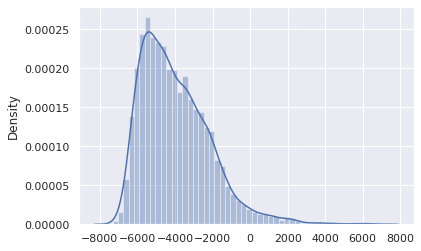

In [178]:
plt.subplots()
for key, value in tcga_after_gene_exclusion.items():
    sns.distplot(tcga_after_gene_exclusion['all_genes'], label = 'all')
    sns.distplot(tcga_after_gene_exclusion['KLHL14'], label = 'KLHL14')
#plt.legend()
plt.show()

### Survival

In [179]:
survival = prepare_survival_annotation(tcga_anno.OS, tcga_anno.OS_FLAG)

In [183]:
geneset_of_interest = {'GeneSet':GeneSet('Geneset', '', list(set(signature_of_interest)))}

ACC


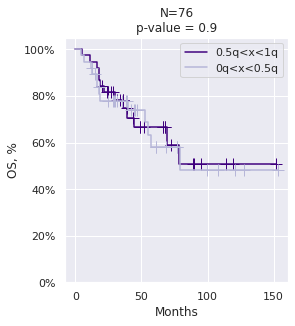

BLCA


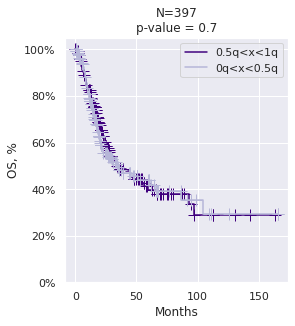

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BRCA


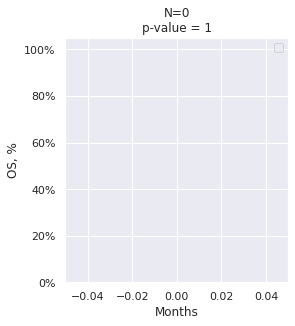

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


CESC


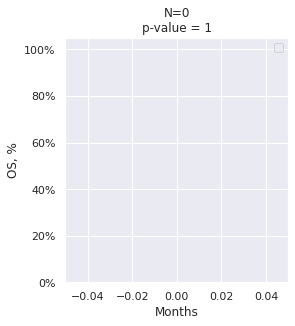

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


CHOL


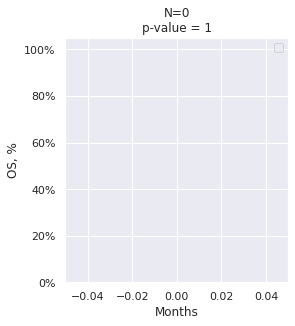

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


COAD


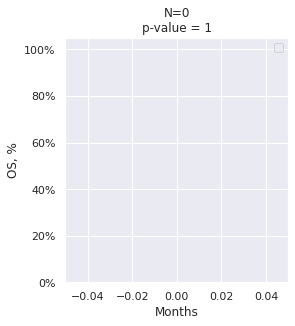

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DLBC


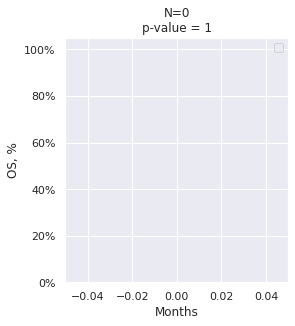

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESCA


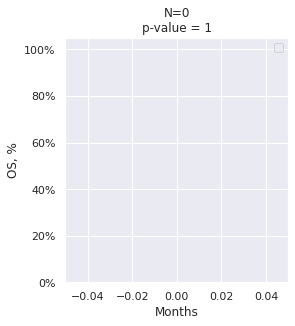

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


GBM


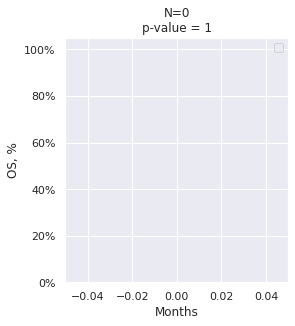

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


HNSC


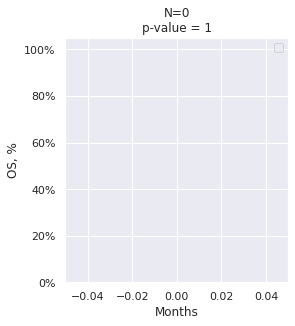

KICH


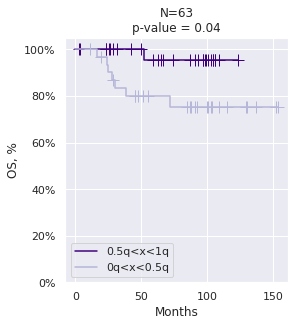

KIRC


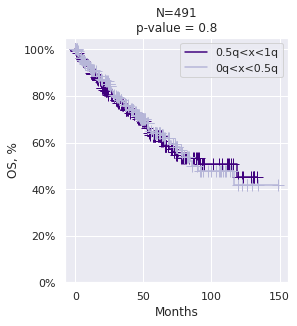

KIRP


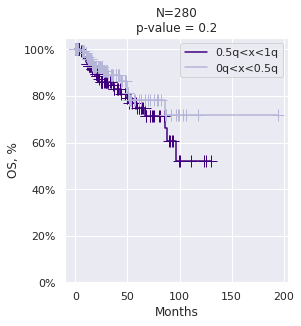

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


LAML


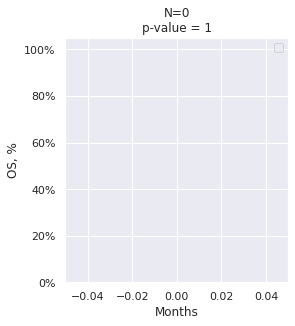

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


LGG


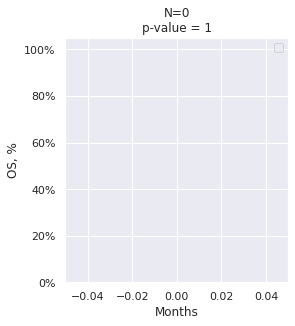

LIHC


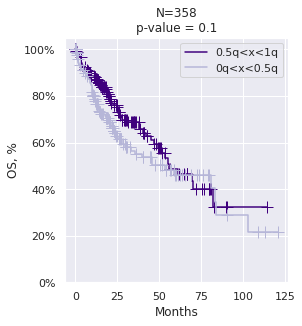

LUAD


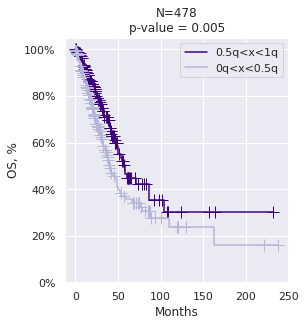

LUSC


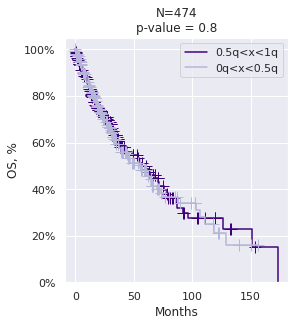

MESO


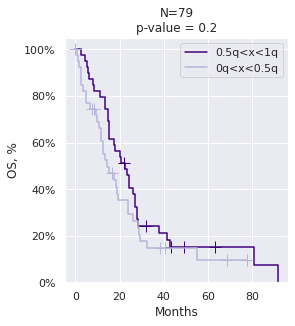

OV


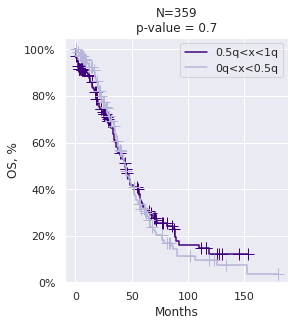

PAAD


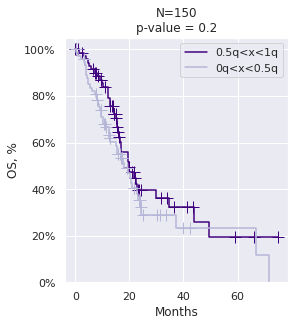

PCPG


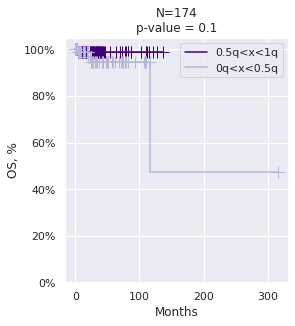

PRAD


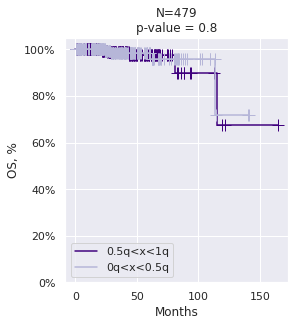

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


READ


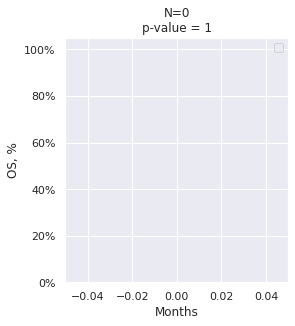

SARC


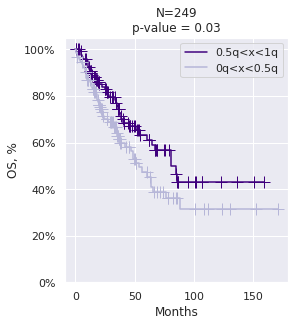

SKCM


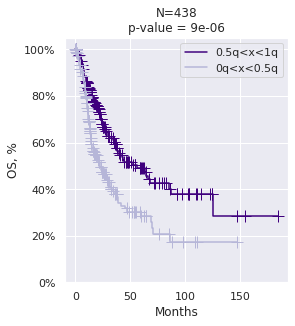

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


STAD


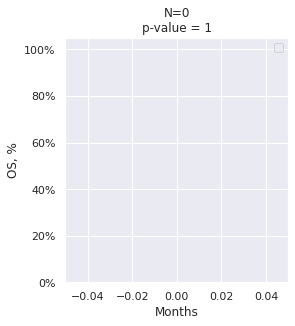

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


TGCT


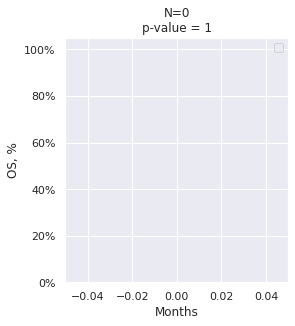

THCA


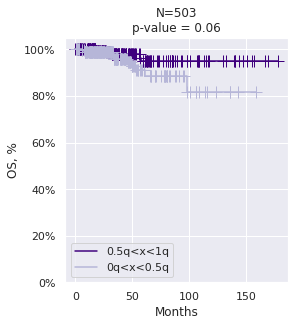

THYM


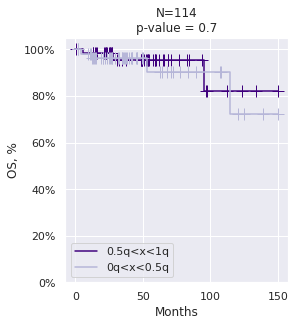

UCEC


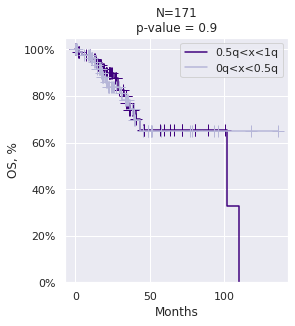

UCS


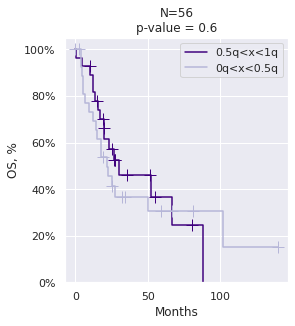

UVM


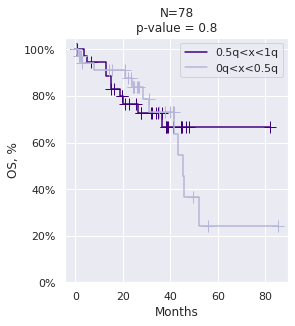

In [185]:
for diagnosis in tcga_anno.acronym.unique():
    print(diagnosis)
    kaplan_meier_quantiles(tcga_ssgsea['B cell activation'].reindex(tcga_anno[tcga_anno.acronym==diagnosis].index), survival)
    plt.show()

### Correlation with any celltype from deconvolution

In [186]:
#list all available celltypes from deconvolution
tcga_deconv.index.tolist()

['B_cells',
 'CD4_T_cells',
 'CD8_T_cells',
 'CD8_T_cells_PD1_high',
 'CD8_T_cells_PD1_low',
 'Endothelium',
 'Fibroblasts',
 'Lymphocytes',
 'Macrophages',
 'Macrophages_M1',
 'Macrophages_M2',
 'Monocytes',
 'Monocytic_cells',
 'NK_cells',
 'Neutrophils',
 'Non_plasma_B_cells',
 'Other',
 'Plasma_B_cells',
 'Stromal_cells',
 'T_cells',
 'T_helpers',
 'Tregs',
 'Tumor']

In [187]:
tcga_ssgsea

,B cell activation
TCGA-ZB-A964-01,-0.091013
TCGA-4V-A9QR-01,0.929004
TCGA-XU-A92Z-01,-0.388840
TCGA-XU-A936-01,4.194248
TCGA-5K-AAAP-01,-0.479721
...,...
TCGA-TS-A7P7-01,-0.521465
TCGA-TS-A8AV-01,1.117764
TCGA-UT-A88E-01,-1.099891
TCGA-TS-A7P6-01,-0.557366


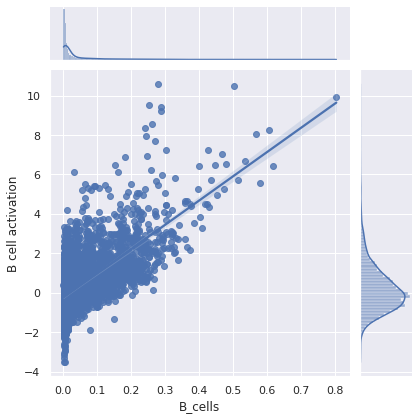

In [189]:
celltype_from_deconv = 'B_cells'

sns.jointplot(tcga_deconv.loc[celltype_from_deconv], tcga_ssgsea[signature_name], kind='reg')
plt.show()

In [190]:
import scipy
print(f'Spearman correlation, {celltype_from_deconv} vs {signature_name}:')
scipy.stats.spearmanr(tcga_deconv.loc[celltype_from_deconv], tcga_ssgsea[signature_name])

Spearman correlation, B_cells vs B cell activation:


SpearmanrResult(correlation=0.5305291748550454, pvalue=0.0)

In [191]:
print(f'Pearson correlation, {celltype_from_deconv} vs {signature_name}:')
scipy.stats.pearsonr(tcga_deconv.loc[celltype_from_deconv], tcga_ssgsea[signature_name])

Pearson correlation, B_cells vs B cell activation:


(0.6415870315902561, 0.0)

# Signature validation: single cell data

In [192]:
import scanpy as sc

### Definition of custom signature (once again, same as above)

In [193]:
#signature_of_interest = '''IGLL3P	IGKC	IGHM	GUSBP11	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22',
'FCRL1',
'KLHL14',
'TNFRSF13B']

#add here a custon signature name (as a first input)
signature_name = 'B cell activation'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

### read annotation and expressions

https://docs.google.com/spreadsheets/d/1OPG6o5rq8lOnP1QZm8gSmgLPjq3Vz-gM6o3i8wzkBbQ/edit#gid=0 - here we have a full list of single cell data, pick anything suitable for your signature. Replace path in cell below with the path you see in H5ad column

In [205]:
adata = sc.read('/uftp/single_cell/annotations/BostonGene_data/Integrated/Bcells_umap_forceDirGraph.h5ad')

In [206]:
# check which column describes celltype in your  adata and pick this columns for the next cell in notebook
adata.obs

,cell_type,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
AAACCCAAGACTGAGC_5,B naive,5,0,707,2765.0,281.0,10.162748
AAACCCACAGGATTCT_5,B naive,5,0,1003,2850.0,294.0,10.315789
AAACCCAGTCACTCTC_5,B naive,5,0,703,2247.0,198.0,8.811749
AAACCCAGTCTTGCGG_5,B naive,5,0,754,2410.0,272.0,11.286307
AAACCCATCACCGACG_5,B naive,5,0,849,4253.0,432.0,10.157536
...,...,...,...,...,...,...,...
TTTGTTGGTAGTCCTA_19,B naive,19,4,874,2364.0,208.0,8.798646
TTTGTTGGTATTGGCT_19,B naive,19,4,957,3064.0,386.0,12.597911
TTTGTTGGTCACTTCC_19,B naive,19,4,1142,3201.0,268.0,8.372383
TTTGTTGGTTTAAGGA_19,B naive,19,4,1414,4323.0,369.0,8.535739


In [207]:
celltype_col = 'cell_type'

In [208]:
#logn TPM+1
adata.X = scipy.sparse.csc_matrix(adata.X)
expr_df = pd.DataFrame.sparse.from_spmatrix(adata.X, index=adata.obs_names, columns=adata.var_names).T
expr_df

,AAACCCAAGACTGAGC_5,AAACCCACAGGATTCT_5,AAACCCAGTCACTCTC_5,AAACCCAGTCTTGCGG_5,AAACCCATCACCGACG_5,AAACGAAAGCACCTGC_5,AAACGAACACCCTAAA_5,AAACGAAGTGCGAACA_5,AAACGCTCACCCTGTT_5,AAACGCTCACTTGAAC_5,...,TTTGGTTCAACTCGTA_19,TTTGGTTCAGCATACT_19,TTTGGTTGTGGTGATG_19,TTTGTTGAGCATTTGC_19,TTTGTTGAGTCTGTAC_19,TTTGTTGGTAGTCCTA_19,TTTGTTGGTATTGGCT_19,TTTGTTGGTCACTTCC_19,TTTGTTGGTTTAAGGA_19,TTTGTTGTCTCTGCTG_19
ISG15,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,...,-0.406303,1.853289,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303
TTLL10,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,...,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728,-0.030728
TNFRSF18,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,...,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868,-0.090868
TNFRSF4,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,...,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307
FAM132A,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,...,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-CO3,0.198768,0.350189,0.542239,0.915068,1.126729,0.304823,0.244987,1.520344,1.606581,0.655967,...,-1.536891,-0.523755,0.084932,-1.500057,-0.127668,-0.443403,1.372876,-1.205065,-1.547419,0.314480
MT-ND4,0.682392,1.098496,-0.583755,0.140582,-0.551137,-1.997020,0.351226,0.040108,0.143972,0.884809,...,-0.101182,-0.065472,-1.295122,-1.536606,-0.739537,-0.507689,0.721893,0.299778,0.645661,2.012048
MT-ND5,-1.316242,-0.768523,0.028035,0.264955,-0.603449,-2.674754,0.273032,1.645300,-0.140832,-0.254335,...,0.664024,0.025827,-0.392002,-2.351483,-0.064330,0.579412,0.974994,1.549101,0.270335,1.720889
MT-ND6,-0.860418,-0.860418,2.041445,-0.860418,-0.860418,-0.860418,-0.860418,1.303074,-0.860418,-0.860418,...,0.788329,0.519602,1.299329,-0.860418,-0.860418,-0.860418,-0.860418,0.932927,0.655840,0.719857


### delete genes w zero counts

In [209]:
row_sums = expr_df.sum(axis=1)
row_sums

ISG15       0.000854
TTLL10     -0.000002
TNFRSF18   -0.000666
TNFRSF4     0.000082
FAM132A     0.000272
              ...   
MT-CO3      0.000366
MT-ND4      0.000427
MT-ND5      0.000542
MT-ND6     -0.000168
MT-CYB      0.000328
Length: 3000, dtype: float32

In [210]:
row_sums = row_sums[row_sums > 0]
row_sums

ISG15      0.000854
TNFRSF4    0.000082
FAM132A    0.000272
ACAP3      0.000443
RNF207     0.000122
             ...   
MT-CO2     0.000183
MT-CO3     0.000366
MT-ND4     0.000427
MT-ND5     0.000542
MT-CYB     0.000328
Length: 1512, dtype: float32

In [211]:
#If the matrix is too big (> 20k cells) it can be better to replace expr_df instead of creating a copy
expr_df_final = expr_df.loc[row_sums.index]
expr_df_final

,AAACCCAAGACTGAGC_5,AAACCCACAGGATTCT_5,AAACCCAGTCACTCTC_5,AAACCCAGTCTTGCGG_5,AAACCCATCACCGACG_5,AAACGAAAGCACCTGC_5,AAACGAACACCCTAAA_5,AAACGAAGTGCGAACA_5,AAACGCTCACCCTGTT_5,AAACGCTCACTTGAAC_5,...,TTTGGTTCAACTCGTA_19,TTTGGTTCAGCATACT_19,TTTGGTTGTGGTGATG_19,TTTGTTGAGCATTTGC_19,TTTGTTGAGTCTGTAC_19,TTTGTTGGTAGTCCTA_19,TTTGTTGGTATTGGCT_19,TTTGTTGGTCACTTCC_19,TTTGTTGGTTTAAGGA_19,TTTGTTGTCTCTGCTG_19
ISG15,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,...,-0.406303,1.853289,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303,-0.406303
TNFRSF4,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,...,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307,-0.014307
FAM132A,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,...,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396,-0.032396
ACAP3,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,...,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505,-0.150505
RNF207,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,...,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746,-0.030746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-CO2,0.545512,0.986007,0.169915,1.119558,1.142693,-0.906704,1.860309,1.248878,0.440091,1.092053,...,0.318465,-0.104182,0.210638,-0.813494,-1.548722,0.479647,1.320959,-0.648953,0.082472,0.712501
MT-CO3,0.198768,0.350189,0.542239,0.915068,1.126729,0.304823,0.244987,1.520344,1.606581,0.655967,...,-1.536891,-0.523755,0.084932,-1.500057,-0.127668,-0.443403,1.372876,-1.205065,-1.547419,0.314480
MT-ND4,0.682392,1.098496,-0.583755,0.140582,-0.551137,-1.997020,0.351226,0.040108,0.143972,0.884809,...,-0.101182,-0.065472,-1.295122,-1.536606,-0.739537,-0.507689,0.721893,0.299778,0.645661,2.012048
MT-ND5,-1.316242,-0.768523,0.028035,0.264955,-0.603449,-2.674754,0.273032,1.645300,-0.140832,-0.254335,...,0.664024,0.025827,-0.392002,-2.351483,-0.064330,0.579412,0.974994,1.549101,0.270335,1.720889


### ssgsea

In [212]:
cgenes = expr_df_final
#cgenes = cgenes.fillna(cgenes.median(axis=1))

cprocesses = ssgsea_formula(cgenes, gmt_genes_alt_names(geneset_of_interest, cgenes.index, verbose=False), rank_method='average').T
cprocesses_sc = median_scale(cprocesses)
#if we don't want to scale ssgsea scores:
#cprocesses_sc = cprocesses

In [213]:
cprocesses_sc["Cell_types"] = adata.obs[celltype_col].tolist()
cprocesses_sc["Cell_name"] = cprocesses_sc.index
cprocesses_sc

,B cell activation,Cell_types,Cell_name
AAACCCAAGACTGAGC_5,80.657733,B naive,AAACCCAAGACTGAGC_5
AAACCCACAGGATTCT_5,-0.112415,B naive,AAACCCACAGGATTCT_5
AAACCCAGTCACTCTC_5,0.674490,B naive,AAACCCAGTCACTCTC_5
AAACCCAGTCTTGCGG_5,0.112415,B naive,AAACCCAGTCTTGCGG_5
AAACCCATCACCGACG_5,0.281037,B naive,AAACCCATCACCGACG_5
...,...,...,...
TTTGTTGGTAGTCCTA_19,0.000000,B naive,TTTGTTGGTAGTCCTA_19
TTTGTTGGTATTGGCT_19,0.112415,B naive,TTTGTTGGTATTGGCT_19
TTTGTTGGTCACTTCC_19,-0.224830,B naive,TTTGTTGGTCACTTCC_19
TTTGTTGGTTTAAGGA_19,-0.562075,B naive,TTTGTTGGTTTAAGGA_19


In [214]:
df_all = cprocesses_sc

In [215]:
# sort all ssdata according to signature abundance
ctypes_median = pd.Series(data="NA", index=set(adata.obs[celltype_col].tolist()))

for type_name in df_all["Cell_types"]:
    ctypes_median[type_name] = df_all.loc[df_all['Cell_types'] == type_name][signature_name].median()

In [216]:
df_median = ctypes_median.sort_values(ascending = False)
df_median

B intermediate     0.281037
B naive           0.0562075
B memory           -0.22483
dtype: object

[Text(0, 0, 'B intermediate'), Text(1, 0, 'B naive'), Text(2, 0, 'B memory')]

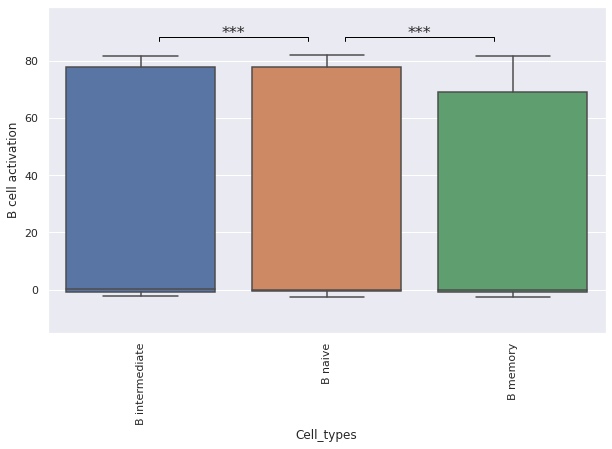

In [217]:
ax = boxplot_with_pvalue(cprocesses_sc[signature_name], df_all["Cell_types"], order = df_median.index, swarm=False,
                   figsize = [10, 6])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

### UMAP plots

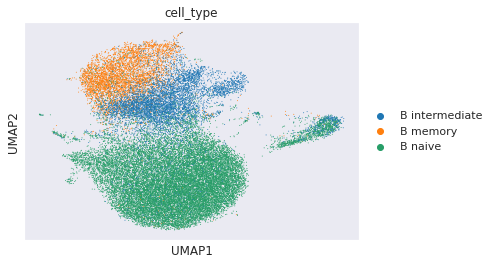

In [218]:
sc.pl.umap(adata, color=[celltype_col])

In [219]:
# If this returns False, report it to the developer of the notebook
all(cprocesses_sc.index == adata.obs_names)

True

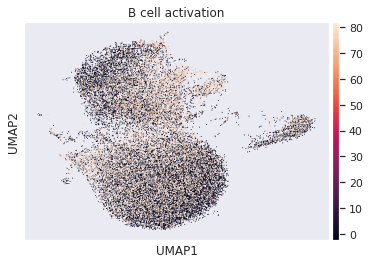

In [220]:
#umap with ssgsea score
adata.obs[signature_name] = cprocesses_sc[signature_name]
sc.pl.umap(adata, color=[signature_name])

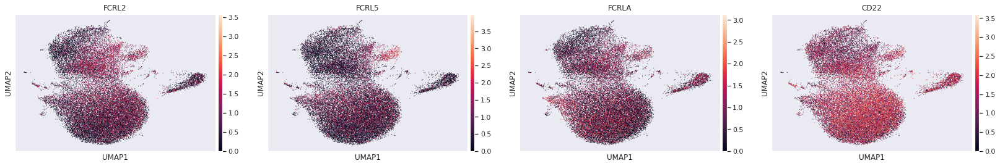

In [222]:
#umap with custom genes (ln expressions)
genes_of_interest = ['FCRL2',
'FCRL5',
'FCRLA',
'CD22']
sc.pl.umap(adata, color=genes_of_interest)

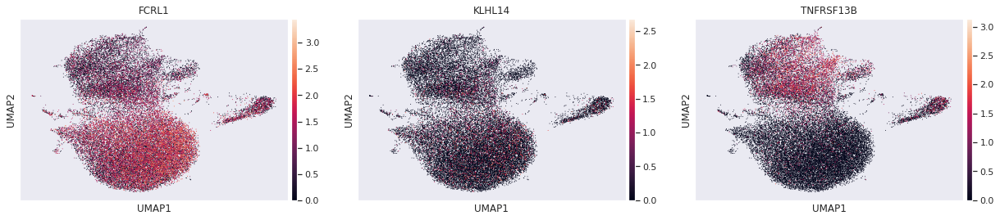

In [223]:
#umap with custom genes (ln expressions)
genes_of_interest = ['FCRL1',
'KLHL14',
'TNFRSF13B']
sc.pl.umap(adata, color=genes_of_interest)

In [224]:
import plotly.express as px

tsne_repr_mean_var_lab = pd.DataFrame(adata.obsm['X_umap'])
tsne_repr_mean_var_lab.index = cgenes.columns
tsne_repr_mean_var_lab['Cell_types'] = cprocesses_sc['Cell_types'].reindex(tsne_repr_mean_var_lab.index)
tsne_repr_mean_var_lab[signature_name] = cprocesses_sc[signature_name].reindex(tsne_repr_mean_var_lab.index)


fig = px.scatter(tsne_repr_mean_var_lab, x=0, y=1, color=signature_name, 
                 title='UMAP plot',hover_data=['Cell_types'] )
fig.show('notebook')